In [22]:
import pandas as pd
import os
from glob import glob
import re



In [23]:
def get_comnined_df(path = "/kaggle/input/risk-management"):
    
    path = path
    csv_files = glob(os.path.join(path, "*.csv"))
    combined_dfs = []
    for file in csv_files:
        filename = os.path.basename(file).replace(".csv", "")
        print(filename)
        lag_match = re.search(r'_(\d+)_', filename)
        Type = filename.strip().split('_')[-4]
        lag = int(lag_match.group(1)) if lag_match else None    
        df = pd.read_csv(file)
        df['lag'] = lag
        df['Type'] = Type
        combined_dfs.append(df)
    df = pd.concat(combined_dfs, ignore_index=True)
    df.rename(columns = {'Unnamed: 0':'Ticker'}, inplace = True)
    return df
def clean_df(data):
    print(data.columns)
    data = data[['Start_x', 'End_x','Ticker','Model','lag', 'Accuracy_x', 'Confusion Matrix_x','Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y', 'Type','Sharpe Ratio_x','# Trades_x','# Trades_y','Sharpe Ratio_y']]
    data.reset_index(inplace = True,drop = True)


    def get_metrics(data):
        def extract_matrix_values(matrix_str):
            matrix_str = str(matrix_str)
            numbers = re.findall(r'\d+', matrix_str)
            if len(numbers) < 4:
                return pd.Series({'TN': 1, 'FP': 1, 'FN': 1, 'TP': 1})
            
            numbers = [int(x) for x in numbers]
            
            return pd.Series({
                'TN': numbers[0],
                'FP': numbers[1],
                'FN': numbers[2],
                'TP': numbers[3]
            })
        new_columns = data['Confusion Matrix_x'].apply(extract_matrix_values)
        data[['TN', 'FP', 'FN', 'TP']] = new_columns
        
        def calculate_metrics(row):
            tp = row.get('TP', 0)
            fp = row.get('FP', 0)
            fn = row.get('FN', 0)
            tn = row.get('TN', 0)

            precision = tp / (tp + fp) if (tp + fp) != 0 else 0
            tpr = tp / (tp + fn) if (tp + fn) != 0 else 0  # True Positive Rate (Recall)
            fpr = fp / (fp + tn) if (fp + tn) != 0 else 0  # False Positive Rate

            return pd.Series({
                'Precision': precision,
                'TPR': tpr,         
                'FPR': fpr
            })

        
        metrics = data.apply(calculate_metrics, axis=1)
        data = pd.concat([data, metrics], axis=1)
        data.drop(columns = ['Confusion Matrix_x'],inplace = True)
        return data

    data = get_metrics(data)
    return data


In [24]:
df =get_comnined_df(r'C:\Users\sachi\Documents\Researchcode\master_combined_risk_test_date_0024_check')
df = clean_df(df)

master_combined_df_0_grid_same_test_date
master_combined_df_0_normal_same_test_date
master_combined_df_0_random_same_test_date
master_combined_df_10_grid_same_test_date
master_combined_df_10_normal_same_test_date
master_combined_df_10_random_same_test_date
master_combined_df_15_grid_same_test_date
master_combined_df_15_normal_same_test_date
master_combined_df_15_random_same_test_date
master_combined_df_20_grid_same_test_date
master_combined_df_20_normal_same_test_date
master_combined_df_20_random_same_test_date
master_combined_df_25_grid_same_test_date
master_combined_df_25_normal_same_test_date
master_combined_df_25_random_same_test_date
master_combined_df_30_grid_same_test_date
master_combined_df_30_normal_same_test_date
master_combined_df_30_random_same_test_date
master_combined_df_35_grid_same_test_date
master_combined_df_35_normal_same_test_date
master_combined_df_35_random_same_test_date
master_combined_df_40_grid_same_test_date
master_combined_df_40_normal_same_test_date
master_

C:\Users\sachi\AppData\Local\Temp\ipykernel_44360\1499492890.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[['TN', 'FP', 'FN', 'TP']] = new_columns
C:\Users\sachi\AppData\Local\Temp\ipykernel_44360\1499492890.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[['TN', 'FP', 'FN', 'TP']] = new_columns
C:\Users\sachi\AppData\Local\Temp\ipykernel_44360\1499492890.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Checking the Null Values

In [25]:
pd.set_option('display.max_columns', None)

In [26]:
df.isnull().sum()

Start_x                      0
End_x                        0
Ticker                       0
Model                        0
lag                          0
Accuracy_x                 390
Return [%]_x                 0
Buy & Hold Return [%]_x      0
Return [%]_y                 0
Type                         0
Sharpe Ratio_x              13
# Trades_x                   0
# Trades_y                   0
Sharpe Ratio_y              14
TN                           0
FP                           0
FN                           0
TP                           0
Precision                    0
TPR                          0
FPR                          0
dtype: int64

Removing the actual returns which was from y_test 

In [27]:
data = df[df['Model'] != 'Actual']

In [28]:
data.isnull().sum()

Start_x                     0
End_x                       0
Ticker                      0
Model                       0
lag                         0
Accuracy_x                  0
Return [%]_x                0
Buy & Hold Return [%]_x     0
Return [%]_y                0
Type                        0
Sharpe Ratio_x             13
# Trades_x                  0
# Trades_y                  0
Sharpe Ratio_y             14
TN                          0
FP                          0
FN                          0
TP                          0
Precision                   0
TPR                         0
FPR                         0
dtype: int64

Dealing with Sharpe Ratio Value which is null

Naive Bayes on lag 40 -50 was not able to predict the market predicting all the trend to be negative for AMZN

In [29]:
data[data['Sharpe Ratio_x'].isnull()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
3020,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,40,0.389381,0.0,22.496772,5.8504,random,NaN,1,1,0.652532,307,0,483,1,1.0,0.002066,0.0
3150,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,45,0.388116,0.0,22.496772,0.0000,grid,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3280,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,45,0.388116,0.0,22.496772,0.0000,normal,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3410,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,45,0.388116,0.0,22.496772,0.0000,random,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3540,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,50,0.388116,0.0,22.496772,0.0000,grid,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3670,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,50,0.388116,0.0,22.496772,0.0000,normal,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3800,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,50,0.388116,0.0,22.496772,0.0000,random,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3930,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,55,0.388116,0.0,22.496772,0.0000,grid,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
4060,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,55,0.388116,0.0,22.496772,0.0000,normal,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
4190,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,55,0.388116,0.0,22.496772,0.0000,random,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0


In [30]:
data[data['Sharpe Ratio_y'].isnull()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
2760,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,40,0.389381,6.1344,22.496772,0.0,grid,0.651428,1,1,NaN,307,0,483,1,1.0,0.002066,0.0
2890,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,40,0.389381,6.1344,22.496772,0.0,normal,0.651428,1,1,NaN,307,0,483,1,1.0,0.002066,0.0
3150,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,45,0.388116,0.0000,22.496772,0.0,grid,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3280,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,45,0.388116,0.0000,22.496772,0.0,normal,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3410,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,45,0.388116,0.0000,22.496772,0.0,random,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3540,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,50,0.388116,0.0000,22.496772,0.0,grid,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3670,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,50,0.388116,0.0000,22.496772,0.0,normal,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3800,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,50,0.388116,0.0000,22.496772,0.0,random,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
3930,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,55,0.388116,0.0000,22.496772,0.0,grid,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0
4060,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,55,0.388116,0.0000,22.496772,0.0,normal,NaN,0,0,NaN,307,0,484,0,0.0,0.000000,0.0


In [31]:
data.Ticker.value_counts()

Ticker
AAPL     468
AMD      468
AMZN     468
GOOGL    468
META     468
MSFT     468
NFLX     468
NVDA     468
SPY      468
TSLA     468
Name: count, dtype: int64

We tested 468 models  in each Tickers, 12 models with 3 different configuration under 13 different lag.

In [32]:
data.Model.value_counts()

Model
Logistic Regression    390
Random Forest          390
XGBoost                390
SVM                    390
Naive Bayes            390
Gradient Boosting      390
K-Nearest Neighbors    390
Decision Tree          390
AdaBoost               390
SGD Classifier         390
MLP                    390
LGBMClassifier         390
Name: count, dtype: int64

We tested 390 stocks  in each Models, 10 stocks with 3 different configuration under 13 different lag.

In [33]:
data.columns

Index(['Start_x', 'End_x', 'Ticker', 'Model', 'lag', 'Accuracy_x',
       'Return [%]_x', 'Buy & Hold Return [%]_x', 'Return [%]_y', 'Type',
       'Sharpe Ratio_x', '# Trades_x', '# Trades_y', 'Sharpe Ratio_y', 'TN',
       'FP', 'FN', 'TP', 'Precision', 'TPR', 'FPR'],
      dtype='object')

In [34]:
data.groupby(['Ticker','Model'])[['Accuracy_x',
       'Return [%]_x', 'Buy & Hold Return [%]_x', 'Return [%]_y']].mean()

Accuracy_x  Return [%]_x  Buy & Hold Return [%]_x  \
Ticker Model                                                                    
AAPL   AdaBoost               0.884178     -1.926889                30.377457   
       Decision Tree          0.858537      8.935219                30.377457   
       Gradient Boosting      0.882006      8.514791                30.377457   
       K-Nearest Neighbors    0.851438     12.482695                30.377457   
       LGBMClassifier         0.894292      6.198760                30.377457   
...                                ...           ...                      ...   
TSLA   Naive Bayes            0.574346      7.548930               -29.499572   
       Random Forest          0.861454     79.345471               -29.499572   
       SGD Classifier         0.827547     66.958258               -29.499572   
       SVM                    0.850173     32.703200               -29.499572   
       XGBoost                0.869461     34.929944               -29.499572   

                            Return [%]_y  
Ticker Model                              
AAPL   AdaBoost                 0.207623  
       Decision Tree           11.625396  
       Gradient Boosting       11.062791  
       K-Nearest Neighbors     16.942964  
       LGBMClassifier           7.498358  
...                                  ...  
TSLA   Naive Bayes             16.376638  
       Random Forest           80.567873  
       SGD Classifier          72.958315  
       SVM                     38.139202  
       XGBoost                 52.832699  

[120 rows x 4 columns]

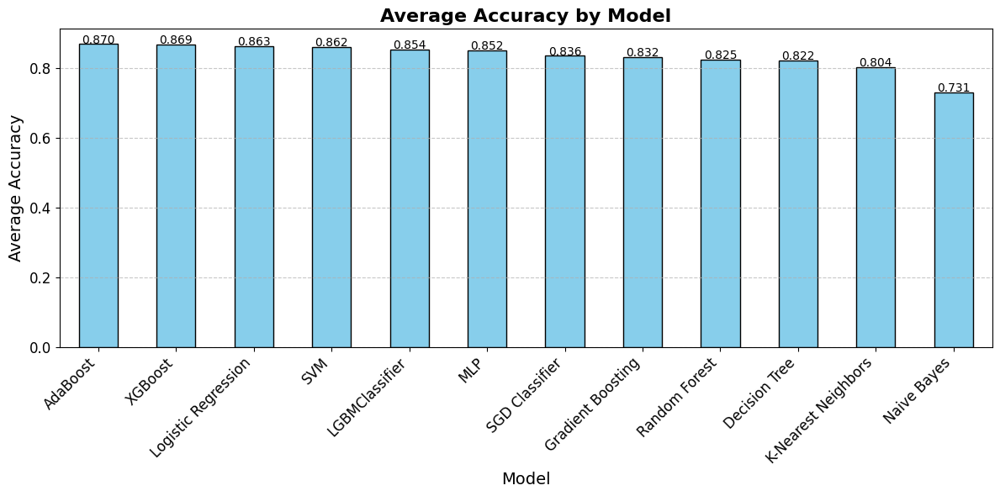

In [35]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))  # Increase figure size
data.groupby('Model')['Accuracy_x'].mean().sort_values(ascending=False).plot(
    kind='bar',
    color='skyblue',
    edgecolor='black'
)

plt.title('Average Accuracy by Model', fontsize=16, fontweight='bold')
plt.xlabel('Model', fontsize=14)
plt.ylabel('Average Accuracy', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(data.groupby('Model')['Accuracy_x'].mean().sort_values(ascending=False)):
    plt.text(i, v + 0.002, f'{v:.3f}', ha='center', fontsize=10)

plt.tight_layout()
plt.show()

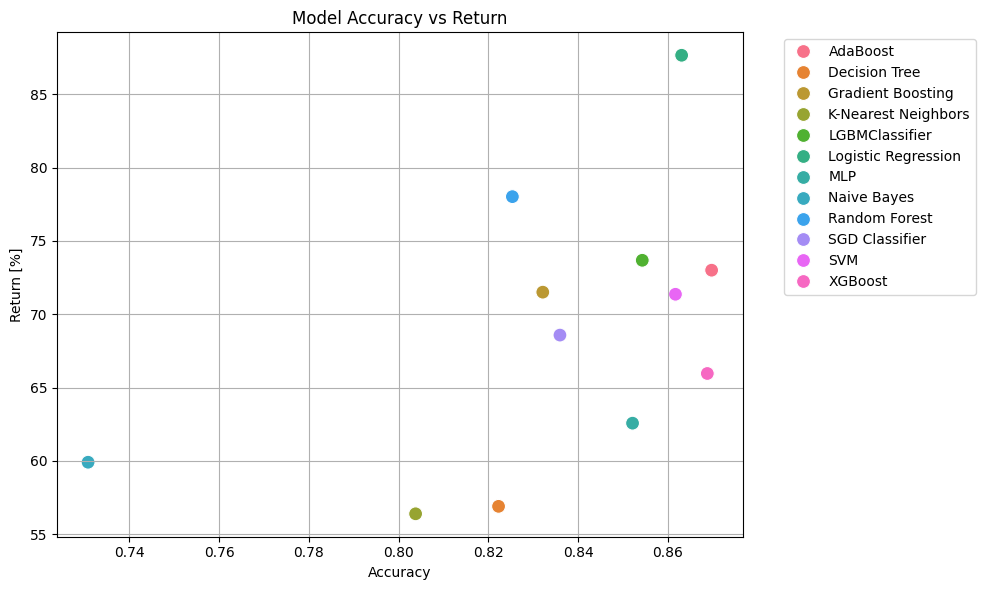

In [36]:
import seaborn as sns
grouped = data.groupby(['Model'])[['Accuracy_x',
       'Return [%]_x']].mean()
plt.figure(figsize=(10, 6))
sns.scatterplot(data=grouped, x='Accuracy_x', y='Return [%]_x', hue='Model', s=100)

plt.title('Model Accuracy vs Return')
plt.xlabel('Accuracy')
plt.ylabel('Return [%]')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


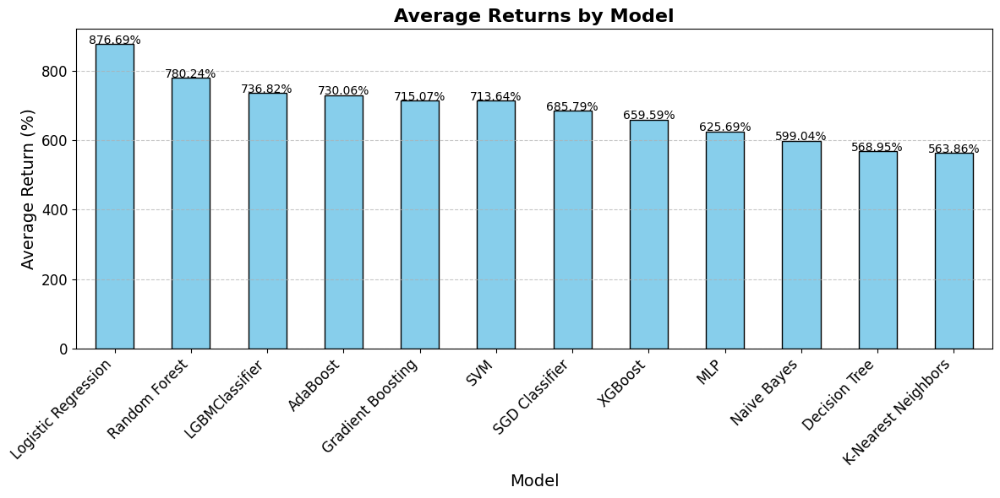

In [37]:
import matplotlib.pyplot as plt

# Aggregate data: Sum by Model, lag, Type → then average per Model
grouped = data.groupby(['Model', 'lag', 'Type'])[['Return [%]_x', 'Buy & Hold Return [%]_x']].sum()
mean_returns = grouped.groupby('Model').mean()

# Plot only 'Return [%]_x'
plt.figure(figsize=(12, 6))
ax = mean_returns['Return [%]_x'].sort_values(ascending=False).plot(
    kind='bar',
    color='skyblue',
    edgecolor='black'
)

plt.title('Average Returns by Model', fontsize=16, fontweight='bold')
plt.xlabel('Model', fontsize=14)
plt.ylabel('Average Return (%)', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate bars
for i, (model, value) in enumerate(mean_returns['Return [%]_x'].sort_values(ascending=False).items()):
    ax.text(i, value + 0.5, f'{value:.2f}%', ha='center', fontsize=10)

plt.tight_layout()
plt.show()


In [38]:
data.groupby('Model')['Accuracy_x'].mean().reset_index()

,Model,Accuracy_x
0,AdaBoost,0.869769
1,Decision Tree,0.822289
2,Gradient Boosting,0.832147
3,K-Nearest Neighbors,0.803806
4,LGBMClassifier,0.854313
5,Logistic Regression,0.863085
6,MLP,0.852148
7,Naive Bayes,0.730824
8,Random Forest,0.825372
9,SGD Classifier,0.835972


In [39]:
merged_df = pd.merge(mean_returns, data.groupby('Model')['Accuracy_x'].mean().reset_index(), on='Model')

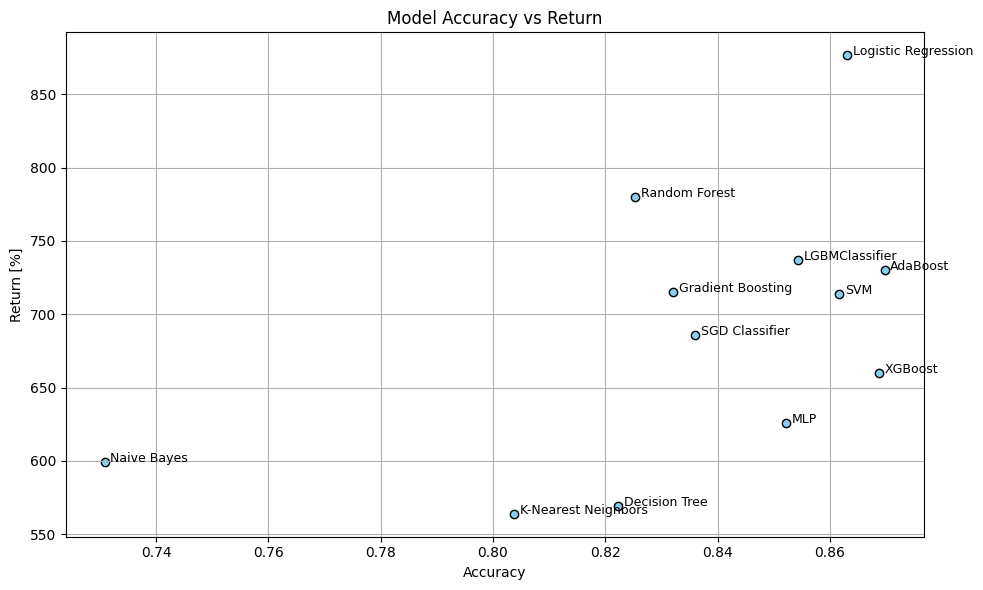

In [40]:
plt.figure(figsize=(10, 6))
plt.scatter(merged_df['Accuracy_x'], merged_df['Return [%]_x'], color='skyblue', edgecolor='black')

# Add model labels to each point
for i in range(len(merged_df)):
    plt.text(merged_df['Accuracy_x'][i] + 0.001, merged_df['Return [%]_x'][i], merged_df['Model'][i], fontsize=9)

plt.title('Model Accuracy vs Return')
plt.xlabel('Accuracy')
plt.ylabel('Return [%]')
plt.grid(True)
plt.tight_layout()
plt.show()

In [41]:
import seaborn as sns
grouped =data.groupby(['Model','lag','Type'])[[
       'Return [%]_x','Buy & Hold Return [%]_x']].sum().groupby('Model').mean()
plt.figure(figsize=(12, 6))
sns.scatterplot(data=grouped, x='Accuracy_x', y='Return [%]_x', hue='Model', s=100)

plt.title('Model Accuracy vs Return')
plt.xlabel('Accuracy')
plt.ylabel('Return [%]')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


ValueError: Could not interpret value `Accuracy_x` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x600 with 0 Axes>

In [42]:
data.shape[0]

4680

In [43]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']][['Ticker','Model','Return [%]_x','Buy & Hold Return [%]_x']].Ticker.value_counts()

Ticker
AMD      468
TSLA     467
META     466
AMZN     327
NFLX     321
SPY      174
NVDA     136
MSFT     118
GOOGL     51
AAPL      23
Name: count, dtype: int64

In [44]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']][['Ticker','Model','Return [%]_x','Buy & Hold Return [%]_x']].groupby('Ticker').Model.value_counts()

Ticker  Model         
AAPL    Naive Bayes       17
        SGD Classifier     3
        MLP                2
        Decision Tree      1
AMD     AdaBoost          39
                          ..
TSLA    Naive Bayes       39
        Random Forest     39
        SVM               39
        XGBoost           39
        SGD Classifier    38
Name: count, Length: 106, dtype: int64

<Axes: xlabel='Ticker'>

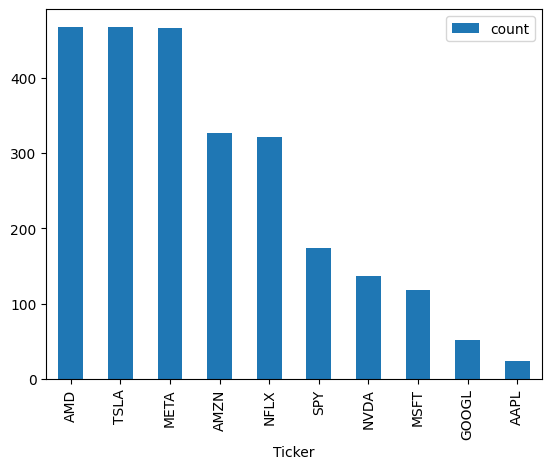

In [45]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']][['Ticker','Model','Return [%]_x','Buy & Hold Return [%]_x']].Ticker.value_counts().reset_index().plot(kind = 'bar',x = 'Ticker')

In [46]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']][['Ticker','Model','Return [%]_x','Buy & Hold Return [%]_x']].Model.value_counts().reset_index()

,Model,count
0,Random Forest,256
1,Logistic Regression,238
2,Gradient Boosting,233
3,K-Nearest Neighbors,230
4,AdaBoost,228
5,XGBoost,215
6,Naive Bayes,207
7,MLP,200
8,LGBMClassifier,196
9,SGD Classifier,193


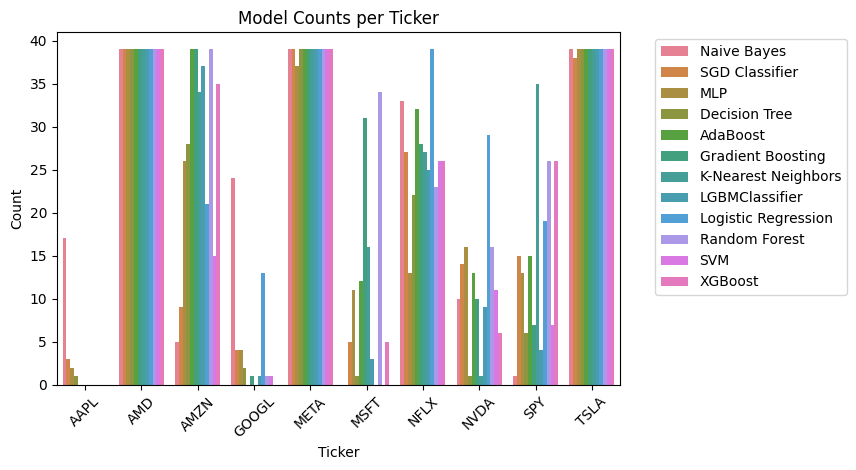

In [47]:
sns.barplot(data=data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']][['Ticker','Model','Return [%]_x','Buy & Hold Return [%]_x']].groupby('Ticker').Model.value_counts().reset_index(), x='Ticker', y='count', hue='Model')

plt.title('Model Counts per Ticker')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Accuracy and Return hypnosis

In [48]:
data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()].iloc[:, 2:].set_index('Ticker').to_latex()

'\\begin{tabular}{llrrrrrlrrrrrrrrrrr}\n\\toprule\n & Model & lag & Accuracy_x & Return [%]_x & Buy & Hold Return [%]_x & Return [%]_y & Type & Sharpe Ratio_x & # Trades_x & # Trades_y & Sharpe Ratio_y & TN & FP & FN & TP & Precision & TPR & FPR \\\\\nTicker &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  \\\\\n\\midrule\nAAPL & XGBoost & 55 & 0.902655 & 17.213918 & 30.377457 & 22.722223 & grid & 0.275652 & 31 & 37 & 0.385171 & 326 & 45 & 32 & 388 & 0.896074 & 0.923810 & 0.121294 \\\\\nAMD & SGD Classifier & 55 & 0.898862 & 45.674401 & -33.765975 & 42.440365 & grid & 0.344451 & 16 & 43 & 0.355052 & 417 & 30 & 50 & 294 & 0.907407 & 0.854651 & 0.067114 \\\\\nAMZN & MLP & 15 & 0.910240 & 46.233523 & 22.496772 & 12.396571 & grid & 0.486348 & 17 & 34 & 0.170778 & 281 & 26 & 45 & 439 & 0.944086 & 0.907025 & 0.084691 \\\\\nGOOGL & Logistic Regression & 20 & 0.927939 & 9.437323 & 16.213708 & 22.094803 & normal & 0.124186 & 22 & 29 & 0.281978 & 340 & 15 & 42 & 394 & 0.963325 & 0.903670 & 

In [49]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].iloc[:, 2:].set_index('Ticker').to_latex()

'\\begin{tabular}{llrrrrrlrrrrrrrrrrr}\n\\toprule\n & Model & lag & Accuracy_x & Return [%]_x & Buy & Hold Return [%]_x & Return [%]_y & Type & Sharpe Ratio_x & # Trades_x & # Trades_y & Sharpe Ratio_y & TN & FP & FN & TP & Precision & TPR & FPR \\\\\nTicker &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  &  \\\\\n\\midrule\nAAPL & Naive Bayes & 0 & 0.883692 & 52.086655 & 30.377457 & 38.375888 & random & 0.772970 & 33 & 26 & 0.581169 & 314 & 57 & 35 & 385 & 0.871041 & 0.916667 & 0.153639 \\\\\nAMD & XGBoost & 25 & 0.844501 & 95.717461 & -33.765975 & 87.694782 & random & 0.703695 & 25 & 18 & 0.643226 & 427 & 20 & 103 & 241 & 0.923372 & 0.700581 & 0.044743 \\\\\nAMZN & XGBoost & 15 & 0.895070 & 91.860315 & 22.496772 & 85.176460 & normal & 0.794970 & 26 & 35 & 0.778165 & 280 & 27 & 56 & 428 & 0.940659 & 0.884298 & 0.087948 \\\\\nGOOGL & Decision Tree & 25 & 0.787611 & 34.953998 & 16.213708 & 34.560160 & random & 0.387196 & 66 & 39 & 0.354686 & 234 & 121 & 47 & 389 & 0.762745 & 0.892202

In [50]:
data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
3902,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,XGBoost,55,0.902655,17.213918,30.377457,22.722223,grid,0.275652,31,37,0.385171,326,45,32,388,0.896074,0.923810,0.121294
3922,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,SGD Classifier,55,0.898862,45.674401,-33.765975,42.440365,grid,0.344451,16,43,0.355052,417,30,50,294,0.907407,0.854651,0.067114
816,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,MLP,15,0.910240,46.233523,22.496772,12.396571,grid,0.486348,17,34,0.170778,281,26,45,439,0.944086,0.907025,0.084691
1339,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Logistic Regression,20,0.927939,9.437323,16.213708,22.094803,normal,0.124186,22,29,0.281978,340,15,42,394,0.963325,0.903670,0.042254
4871,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SGD Classifier,60,0.862200,223.878898,94.434919,243.348462,normal,1.002414,17,24,1.062548,232,47,62,450,0.905433,0.878906,0.168459
984,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,SGD Classifier,15,0.919090,16.617284,17.260642,13.463992,normal,0.274564,17,22,0.230367,353,22,42,374,0.944444,0.899038,0.058667
3205,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Decision Tree,45,0.860936,94.106964,61.218343,62.759669,grid,0.741509,29,45,0.595816,252,17,93,429,0.961883,0.821839,0.063197
872,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Random Forest,15,0.903919,259.226574,298.891140,520.931032,grid,0.788240,25,48,1.173786,295,47,29,420,0.899358,0.935412,0.137427
4663,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,SGD Classifier,5,0.902655,18.207058,22.469699,17.465993,random,0.479156,25,24,0.455796,246,36,41,468,0.928571,0.919450,0.127660
124,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,Decision Tree,0,0.886220,95.231416,-29.499572,24.336261,grid,0.465049,25,57,0.186310,392,62,28,309,0.832884,0.916914,0.136564


In [56]:
data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      XGBoostSGD ClassifierMLPLogistic RegressionSGD...
lag                                                                      285
Accuracy_x                                                          8.974716
Return [%]_x                                                      825.827358
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                       981.95937
Type                        gridgridgridnormalnormalnormalgridgridrandomgrid
Sharpe Ratio_x                                                      4.981568
# Trades_x                                                               224
# Trades_y                                                               363

In [60]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].iloc[:, 2:].set_index('Ticker')

,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
Ticker,,,,,,,,,,,,,,,,,,
AAPL,Naive Bayes,0,0.883692,52.086655,30.377457,38.375888,random,0.772970,33,26,0.581169,314,57,35,385,0.871041,0.916667,0.153639
AMD,XGBoost,25,0.844501,95.717461,-33.765975,87.694782,random,0.703695,25,18,0.643226,427,20,103,241,0.923372,0.700581,0.044743
AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
GOOGL,Decision Tree,25,0.787611,34.953998,16.213708,34.560160,random,0.387196,66,39,0.354686,234,121,47,389,0.762745,0.892202,0.340845
META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
MSFT,Random Forest,20,0.677623,42.026809,17.260642,38.215785,normal,0.808605,16,18,0.749024,364,11,244,172,0.939891,0.413462,0.029333
NFLX,Decision Tree,10,0.810367,161.144968,61.218343,114.764240,grid,0.862458,25,42,0.760932,201,68,82,440,0.866142,0.842912,0.252788
NVDA,Logistic Regression,20,0.876106,574.138232,298.891140,270.006242,random,1.163954,42,22,0.811699,280,62,36,413,0.869474,0.919822,0.181287
SPY,XGBoost,45,0.891277,39.388498,22.469699,36.206726,normal,0.966549,25,27,0.924635,260,22,64,445,0.952891,0.874263,0.078014


In [51]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].iloc[:, 2:].set_index('Ticker')

,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
Ticker,,,,,,,,,,,,,,,,,,
AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
AMD,MLP,30,0.843236,49.966701,-33.765975,89.041727,grid,0.403204,8,24,0.647533,428,19,105,239,0.926357,0.694767,0.042506
AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
GOOGL,Decision Tree,25,0.787611,33.977935,16.213708,34.953998,grid,0.346024,42,66,0.387196,234,121,47,389,0.762745,0.892202,0.340845
META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
MSFT,Gradient Boosting,15,0.690265,33.658183,17.260642,38.593637,grid,0.658163,9,11,0.736065,371,4,241,175,0.977654,0.420673,0.010667
NFLX,Naive Bayes,50,0.579014,104.704615,61.218343,135.570203,random,0.760370,25,20,0.900786,214,55,278,244,0.816054,0.467433,0.204461
NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
SPY,K-Nearest Neighbors,15,0.824273,35.807309,22.469699,41.669320,normal,0.938145,27,29,1.093108,258,24,115,394,0.942584,0.774067,0.085106


In [53]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      Naive BayesXGBoostXGBoostDecision TreeSVMRando...
lag                                                                      220
Accuracy_x                                                          8.285714
Return [%]_x                                                     1616.451936
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1170.307884
Type                       randomrandomnormalrandomgridnormalgridrandomno...
Sharpe Ratio_x                                                      8.595678
# Trades_x                                                               293
# Trades_y                                                               284

In [55]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      SGD ClassifierMLPXGBoostDecision TreeSVMGradie...
lag                                                                      220
Accuracy_x                                                          8.026549
Return [%]_x                                                     1218.232456
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1590.192378
Type                       normalgridnormalgridgridgridrandomgridnormalra...
Sharpe Ratio_x                                                      7.340787
# Trades_x                                                               242
# Trades_y                                                               297

In [59]:
data.loc[data.groupby('Ticker')['Sharpe Ratio_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      Naive BayesXGBoostXGBoostSGD ClassifierSVMRand...
lag                                                                      210
Accuracy_x                                                          8.348925
Return [%]_x                                                     1521.565493
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1174.833351
Type                       randomrandomnormalrandomrandomnormalgridrandom...
Sharpe Ratio_x                                                      8.728726
# Trades_x                                                               300
# Trades_y                                                               285

In [58]:
data.loc[data.groupby('Ticker')['Sharpe Ratio_y'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      SGD ClassifierRandom ForestXGBoostLogistic Reg...
lag                                                                      260
Accuracy_x                                                          8.030341
Return [%]_x                                                     1031.587312
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1428.233413
Type                       normalgridnormalnormalgridrandomrandomgridnorm...
Sharpe Ratio_x                                                      7.376223
# Trades_x                                                               225
# Trades_y                                                               269

In [11]:
data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      XGBoostSGD ClassifierMLPLogistic RegressionSGD...
lag                                                                      285
Accuracy_x                                                          8.974716
Return [%]_x                                                      825.827358
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                       981.95937
Type                        gridgridgridnormalnormalnormalgridgridrandomgrid
Sharpe Ratio_x                                                      4.981568
# Trades_x                                                               224
# Trades_y                                                               363

In [12]:
final_data = data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()]

In [13]:
final_data.groupby('lag')['Model'].value_counts()

lag  Model              
0    Decision Tree          1
5    SGD Classifier         1
15   MLP                    1
     Random Forest          1
     SGD Classifier         1
20   Logistic Regression    1
45   Decision Tree          1
55   SGD Classifier         1
     XGBoost                1
60   SGD Classifier         1
Name: count, dtype: int64

In [14]:
final_data.groupby('lag')['Ticker'].value_counts()

lag  Ticker
0    TSLA      1
5    SPY       1
15   AMZN      1
     MSFT      1
     NVDA      1
20   GOOGL     1
45   NFLX      1
55   AAPL      1
     AMD       1
60   META      1
Name: count, dtype: int64

In [15]:
final_data.groupby('Model')['lag'].value_counts()

Model                lag
Decision Tree        0      1
                     45     1
Logistic Regression  20     1
MLP                  15     1
Random Forest        15     1
SGD Classifier       5      1
                     15     1
                     55     1
                     60     1
XGBoost              55     1
Name: count, dtype: int64

In [16]:
final_data.Model.value_counts()

Model
SGD Classifier         4
Decision Tree          2
XGBoost                1
MLP                    1
Logistic Regression    1
Random Forest          1
Name: count, dtype: int64

In [17]:
data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      XGBoostSGD ClassifierMLPLogistic RegressionSGD...
lag                                                                      285
Accuracy_x                                                          8.974716
Return [%]_x                                                      825.827358
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                       981.95937
Type                        gridgridgridnormalnormalnormalgridgridrandomgrid
Sharpe Ratio_x                                                      4.981568
# Trades_x                                                               224
# Trades_y                                                               363

Our most accurate models were able to cross the buy and hold baseline. But still, this is not the best return this is the most accurate models on each Ticker. Our analysis has found SGD classifier being the most accurate result followed by Trees Models like RF and DT. We can also see the lag 15 being higher count in value where models like RF,MLP,SGD were able to be accurate. If we look at the risk structure strategy 2 sum of the returns in our portfolio. We can see it was even able to outperform the market as well it was able to cross the naked returns only too with 858(with risk management) vs 724 (returns without risk managemtn) vs 500% (buy and hold). 

In [18]:
data.groupby('Ticker')['Model'].value_counts()

Ticker  Model              
AAPL    AdaBoost               39
        Decision Tree          39
        Gradient Boosting      39
        K-Nearest Neighbors    39
        LGBMClassifier         39
                               ..
TSLA    Naive Bayes            39
        Random Forest          39
        SGD Classifier         39
        SVM                    39
        XGBoost                39
Name: count, Length: 120, dtype: int64

In [19]:
data.Ticker.value_counts().reset_index()

,Ticker,count
0,AAPL,468
1,AMD,468
2,AMZN,468
3,GOOGL,468
4,META,468
5,MSFT,468
6,NFLX,468
7,NVDA,468
8,SPY,468
9,TSLA,468


Around 396 models were trained and tested among 10 STOCKS

In [20]:
data.Model.value_counts().reset_index()

,Model,count
0,Logistic Regression,390
1,Random Forest,390
2,XGBoost,390
3,SVM,390
4,Naive Bayes,390
5,Gradient Boosting,390
6,K-Nearest Neighbors,390
7,Decision Tree,390
8,AdaBoost,390
9,SGD Classifier,390


We tested 12 ML models under 10 stocks with almost 330 different configuration for each model

In [21]:
pd.set_option('display.max_rows', None)

In [22]:
data[data['lag'] == 0].groupby('Ticker')[['Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y']].mean()

,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y
Ticker,,,
AAPL,8.505464,30.377457,10.897119
AMD,25.420898,-33.765975,31.750308
AMZN,38.225199,22.496772,31.829771
GOOGL,-4.322820,16.213708,-1.995322
META,209.122043,94.434919,211.016701
MSFT,8.455028,17.260642,10.282151
NFLX,80.762287,61.218343,62.962528
NVDA,272.349387,298.891140,324.747690
SPY,23.970570,22.469699,24.798186


In [23]:
final_data = data.groupby(['Model','Ticker','lag','Type'])[['Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y']].mean().groupby(['lag','Type','Model'])[['Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y']].sum()

In [24]:
final_data[final_data['Return [%]_x'] > final_data['Buy & Hold Return [%]_x']].shape

(443, 3)

from our observation, we found the buy and hold return if we invested in this stock then it would have been 500% return over 3 years. It is a good return isn't it. But if we implemented the machine learning algorithm regardless the lag, regardless any algorithm our portfolio would have substantially outperformed the market. As displayed above we tested 396 different models under different configurations like lag and hyperparameter tuning in each ticker. Outo of 396 models , 379 of them significantly outperform the buy and hold strategy. 

In [25]:
final_data.shape

(468, 3)

In [26]:
final_data.sort_values(by = 'Return [%]_x',ascending = True).head()

,,,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y
lag,Type,Model,,,
60,random,SGD Classifier,278.407271,500.097133,339.056374
40,grid,MLP,405.884544,500.097133,694.576533
45,grid,SGD Classifier,413.889138,500.097133,553.900874
20,normal,K-Nearest Neighbors,415.449510,500.097133,557.402758
60,grid,SGD Classifier,419.057442,500.097133,405.763356


In [27]:
final_data.sort_values(by = 'Return [%]_y',ascending = True).head()

,,,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y
lag,Type,Model,,,
60,random,SGD Classifier,278.407271,500.097133,339.056374
30,random,Naive Bayes,539.672908,500.097133,359.921281
35,random,Naive Bayes,627.090690,500.097133,367.442140
45,random,SGD Classifier,578.138721,500.097133,383.306921
40,random,Naive Bayes,695.801957,500.097133,394.897444


In [28]:
data.Ticker.unique()

array(['AAPL', 'AMD', 'AMZN', 'GOOGL', 'META', 'MSFT', 'NFLX', 'NVDA',
       'SPY', 'TSLA'], dtype=object)

In [29]:
final_data[(final_data['Return [%]_x'] > final_data['Buy & Hold Return [%]_x'])  ]

Return [%]_x  Buy & Hold Return [%]_x  \
lag Type   Model                                                        
0   grid   AdaBoost               638.474977               500.097133   
           Decision Tree          507.300846               500.097133   
           Gradient Boosting      533.242500               500.097133   
           K-Nearest Neighbors    602.647603               500.097133   
           LGBMClassifier         833.499740               500.097133   
           Logistic Regression    823.555039               500.097133   
           MLP                    575.717654               500.097133   
           Naive Bayes            595.299965               500.097133   
           Random Forest          850.447001               500.097133   
           SGD Classifier         691.539154               500.097133   
           SVM                    693.439435               500.097133   
           XGBoost                701.272245               500.097133   
    normal AdaBoost               586.460786               500.097133   
           Decision Tree          592.016947               500.097133   
           Gradient Boosting      603.082619               500.097133   
           K-Nearest Neighbors    606.630786               500.097133   
           LGBMClassifier         833.499740               500.097133   
           Logistic Regression    774.501330               500.097133   
           MLP                    581.292951               500.097133   
           Naive Bayes            603.669358               500.097133   
           Random Forest          763.300323               500.097133   
           SGD Classifier         641.801357               500.097133   
           SVM                    715.660134               500.097133   
           XGBoost                519.717640               500.097133   
    random AdaBoost               978.093985               500.097133   
           Gradient Boosting      662.937564               500.097133   
           K-Nearest Neighbors    896.040529               500.097133   
           LGBMClassifier         946.444104               500.097133   
           Logistic Regression   1028.169412               500.097133   
           MLP                    785.430344               500.097133   
           Naive Bayes            802.501777               500.097133   
           Random Forest          877.015859               500.097133   
           SGD Classifier         890.949168               500.097133   
           SVM                    900.051453               500.097133   
           XGBoost                733.520114               500.097133   
5   grid   AdaBoost               655.996521               500.097133   
           Decision Tree          519.250569               500.097133   
           Gradient Boosting      577.500895               500.097133   
           K-Nearest Neighbors    598.910862               500.097133   
           LGBMClassifier         853.793404               500.097133   
           Logistic Regression    836.526655               500.097133   
           MLP                    598.401290               500.097133   
           Naive Bayes            556.631968               500.097133   
           Random Forest          786.025172               500.097133   
           SGD Classifier         687.619741               500.097133   
           SVM                    777.432614               500.097133   
           XGBoost                674.997234               500.097133   
    normal AdaBoost               602.195923               500.097133   
           Decision Tree          602.651699               500.097133   
           Gradient Boosting      666.768117               500.097133   
           K-Nearest Neighbors    650.686991               500.097133   
           LGBMClassifier         853.793404               500.097133   
           Logistic Regression    597.475252               500.097133   
           Naive 

In [30]:
final_data[final_data['Return [%]_y'] > final_data['Buy & Hold Return [%]_x']].head()

Return [%]_x  Buy & Hold Return [%]_x  \
lag Type Model                                                        
0   grid AdaBoost               638.474977               500.097133   
         Decision Tree          507.300846               500.097133   
         Gradient Boosting      533.242500               500.097133   
         K-Nearest Neighbors    602.647603               500.097133   
         LGBMClassifier         833.499740               500.097133   

                              Return [%]_y  
lag Type Model                              
0   grid AdaBoost               978.093985  
         Decision Tree          592.932955  
         Gradient Boosting      673.677530  
         K-Nearest Neighbors    899.835226  
         LGBMClassifier         946.444104

In [31]:
data.groupby(['Ticker','Model'])[['Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y']].mean().groupby('Model').sum()

,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y
Model,,,
AdaBoost,730.059259,500.097133,782.707042
Decision Tree,568.947424,500.097133,578.197283
Gradient Boosting,715.072436,500.097133,756.914328
K-Nearest Neighbors,563.861992,500.097133,559.640703
LGBMClassifier,736.819711,500.097133,745.659779
Logistic Regression,876.692933,500.097133,874.392748
MLP,625.686450,500.097133,654.046031
Naive Bayes,599.042921,500.097133,603.385070
Random Forest,780.236027,500.097133,802.465472


This is an average return of the models with different lag used in different Ticker. If we look closely, sum of returns of individual returns with machine learning model is able to outperform Buy and Hold sum. 

In [32]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
264,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,52.086655,30.377457,38.375888,random,0.772970,33,26,0.581169,314,57,35,385,0.871041,0.916667,0.153639
1835,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,25,0.844501,95.717461,-33.765975,87.694782,random,0.703695,25,18,0.643226,427,20,103,241,0.923372,0.700581,0.044743
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1866,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,34.953998,16.213708,34.560160,random,0.387196,66,39,0.354686,234,121,47,389,0.762745,0.892202,0.340845
4345,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
1366,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Random Forest,20,0.677623,42.026809,17.260642,38.215785,normal,0.808605,16,18,0.749024,364,11,244,172,0.939891,0.413462,0.029333
475,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Decision Tree,10,0.810367,161.144968,61.218343,114.764240,grid,0.862458,25,42,0.760932,201,68,82,440,0.866142,0.842912,0.252788
1521,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,574.138232,298.891140,270.006242,random,1.163954,42,22,0.811699,280,62,36,413,0.869474,0.919822,0.181287
3356,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,XGBoost,45,0.891277,39.388498,22.469699,36.206726,normal,0.966549,25,27,0.924635,260,22,64,445,0.952891,0.874263,0.078014
4026,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,SGD Classifier,55,0.797724,170.442421,-29.499572,111.252441,grid,0.915256,17,30,0.821154,448,6,154,183,0.968254,0.543027,0.013216


Above represents the best model in terms of returns in each ticker, these models are able to maximize their returns into highest possible. 

In [33]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()][['Return [%]_x','Buy & Hold Return [%]_x','Accuracy_x']].sum()

Return [%]_x               1616.451936
Buy & Hold Return [%]_x     500.097133
Accuracy_x                    8.285714
dtype: float64

In this table, we can see the best models sum in our portfolio. If we look at our portfolio, our best machine learning models are able to get 3 times more return compared to buy and hold strategy. If we talk about the accuracy average is 83.5% which is not that bad either. Lets see how would this be compared to risk management structure.

In [34]:
df[df['Accuracy_x'].isnull()].Model.value_counts()

Model
Actual    390
Name: count, dtype: int64

In [35]:
df['Accuracy_x'].fillna(1,inplace = True)

C:\Users\sachi\AppData\Local\Temp\ipykernel_2636\3310847683.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Accuracy_x'].fillna(1,inplace = True)


In [36]:
df[df['Accuracy_x'].isnull()].Model.value_counts()

Series([], Name: count, dtype: int64)

In [37]:
df.isnull().sum()

Start_x                     0
End_x                       0
Ticker                      0
Model                       0
lag                         0
Accuracy_x                  0
Return [%]_x                0
Buy & Hold Return [%]_x     0
Return [%]_y                0
Type                        0
Sharpe Ratio_x             13
# Trades_x                  0
# Trades_y                  0
Sharpe Ratio_y             14
TN                          0
FP                          0
FN                          0
TP                          0
Precision                   0
TPR                         0
FPR                         0
dtype: int64

In [38]:
data = df[df['Model'] != 'Actual']

In [39]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
4,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,37.917097,30.377457,52.086655,grid,0.570494,26,33,0.772970,314,57,35,385,0.871041,0.916667,0.153639
13,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Logistic Regression,0,0.849558,60.800917,-33.765975,83.446889,grid,0.473115,10,23,0.615952,430,17,102,242,0.934363,0.703488,0.038031
14,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Random Forest,0,0.845765,-2.430272,-33.765975,27.454552,grid,-0.026087,27,50,0.274112,415,32,90,254,0.888112,0.738372,0.071588
15,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,0,0.854614,2.345405,-33.765975,21.813634,grid,0.020854,22,56,0.190994,369,78,37,307,0.797403,0.892442,0.174497
16,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,SVM,0,0.841972,36.611202,-33.765975,43.016023,grid,0.325899,11,38,0.406033,432,15,110,234,0.939759,0.680233,0.033557
17,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Naive Bayes,0,0.840708,5.736412,-33.765975,20.794982,grid,0.053564,31,49,0.207156,401,46,80,264,0.851613,0.767442,0.102908
18,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Gradient Boosting,0,0.850822,21.571031,-33.765975,52.175500,grid,0.201231,26,36,0.458513,423,24,94,250,0.912409,0.726744,0.053691
19,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,K-Nearest Neighbors,0,0.771176,-5.577306,-33.765975,-16.307545,grid,-0.072198,25,51,-0.255959,414,33,148,196,0.855895,0.569767,0.073826
20,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Decision Tree,0,0.817952,-5.056397,-33.765975,3.237650,grid,-0.057430,39,54,0.039138,417,30,114,230,0.884615,0.668605,0.067114
21,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,AdaBoost,0,0.858407,-2.738204,-33.765975,39.006489,grid,-0.026518,22,49,0.340631,393,54,58,286,0.841176,0.831395,0.120805


In [40]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']].Ticker.value_counts()

Ticker
AMD      468
TSLA     467
META     466
AMZN     327
NFLX     321
SPY      174
NVDA     136
MSFT     118
GOOGL     51
AAPL      23
Name: count, dtype: int64

In [41]:
data[data['Return [%]_y'] > data['Buy & Hold Return [%]_x']].Ticker.value_counts()

Ticker
AMD      465
META     463
TSLA     461
AMZN     297
SPY      207
NFLX     199
NVDA     196
MSFT     144
GOOGL     40
AAPL      34
Name: count, dtype: int64

In [42]:
data[data['Return [%]_y'] > data['Buy & Hold Return [%]_x']]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
4,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,37.917097,30.377457,52.086655,grid,0.570494,26,33,0.772970,314,57,35,385,0.871041,0.916667,0.153639
13,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Logistic Regression,0,0.849558,60.800917,-33.765975,83.446889,grid,0.473115,10,23,0.615952,430,17,102,242,0.934363,0.703488,0.038031
14,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Random Forest,0,0.845765,-2.430272,-33.765975,27.454552,grid,-0.026087,27,50,0.274112,415,32,90,254,0.888112,0.738372,0.071588
15,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,0,0.854614,2.345405,-33.765975,21.813634,grid,0.020854,22,56,0.190994,369,78,37,307,0.797403,0.892442,0.174497
16,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,SVM,0,0.841972,36.611202,-33.765975,43.016023,grid,0.325899,11,38,0.406033,432,15,110,234,0.939759,0.680233,0.033557
17,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Naive Bayes,0,0.840708,5.736412,-33.765975,20.794982,grid,0.053564,31,49,0.207156,401,46,80,264,0.851613,0.767442,0.102908
18,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Gradient Boosting,0,0.850822,21.571031,-33.765975,52.175500,grid,0.201231,26,36,0.458513,423,24,94,250,0.912409,0.726744,0.053691
19,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,K-Nearest Neighbors,0,0.771176,-5.577306,-33.765975,-16.307545,grid,-0.072198,25,51,-0.255959,414,33,148,196,0.855895,0.569767,0.073826
20,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Decision Tree,0,0.817952,-5.056397,-33.765975,3.237650,grid,-0.057430,39,54,0.039138,417,30,114,230,0.884615,0.668605,0.067114
21,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,AdaBoost,0,0.858407,-2.738204,-33.765975,39.006489,grid,-0.026518,22,49,0.340631,393,54,58,286,0.841176,0.831395,0.120805


In [43]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']].shape[0]/data.shape[0] * 100

54.508547008547005

In [44]:
average_returns = data.groupby('Ticker')[['Return [%]_x','Buy & Hold Return [%]_x']].mean()

In [45]:
average_returns[average_returns['Return [%]_x'] > average_returns['Buy & Hold Return [%]_x']]

,Return [%]_x,Buy & Hold Return [%]_x
Ticker,,
AMD,25.649435,-33.765975
AMZN,36.728476,22.496772
META,213.794767,94.434919
NFLX,76.250803,61.218343
TSLA,47.012617,-29.499572


In [46]:
average_returns['Return [%]_x'].sum()

np.float64(687.9523577436033)

In [47]:
average_returns['Buy & Hold Return [%]_x'].sum()

np.float64(500.09713287421425)

In [48]:
data.groupby('Ticker')[['Return [%]_x','Buy & Hold Return [%]_x']].sum().sum()

Return [%]_x               321961.703424
Buy & Hold Return [%]_x    234045.458185
dtype: float64

In [49]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()][['Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y']].sum()

Return [%]_x               1616.451936
Buy & Hold Return [%]_x     500.097133
Return [%]_y               1170.307884
dtype: float64

In [50]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()][['Return [%]_x','Buy & Hold Return [%]_x','Return [%]_y']].sum()

Return [%]_x               1218.232456
Buy & Hold Return [%]_x     500.097133
Return [%]_y               1590.192378
dtype: float64

In [51]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].Model.value_counts()

Model
XGBoost                3
Decision Tree          2
Naive Bayes            1
SVM                    1
Random Forest          1
Logistic Regression    1
SGD Classifier         1
Name: count, dtype: int64

In [52]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Model.value_counts()

Model
Gradient Boosting      2
SGD Classifier         1
MLP                    1
Decision Tree          1
XGBoost                1
SVM                    1
Naive Bayes            1
Logistic Regression    1
K-Nearest Neighbors    1
Name: count, dtype: int64

In [53]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].Type.value_counts()

Type
random    4
normal    3
grid      3
Name: count, dtype: int64

In [54]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Type.value_counts()

Type
grid      5
normal    3
random    2
Name: count, dtype: int64

In [55]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].lag.value_counts()

lag
25    2
20    2
15    1
0     1
5     1
10    1
45    1
55    1
Name: count, dtype: int64

In [56]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].lag.value_counts()

lag
15    4
30    2
25    1
5     1
50    1
20    1
Name: count, dtype: int64

In [57]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
2089,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
1973,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,MLP,30,0.843236,49.966701,-33.765975,89.041727,grid,0.403204,8,24,0.647533,428,19,105,239,0.926357,0.694767,0.042506
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1606,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,33.977935,16.213708,34.953998,grid,0.346024,42,66,0.387196,234,121,47,389,0.762745,0.892202,0.340845
4345,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
850,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Gradient Boosting,15,0.690265,33.658183,17.260642,38.593637,grid,0.658163,9,11,0.736065,371,4,241,175,0.977654,0.420673,0.010667
3852,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Naive Bayes,50,0.579014,104.704615,61.218343,135.570203,random,0.760370,25,20,0.900786,214,55,278,244,0.816054,0.467433,0.204461
1261,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
1020,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,K-Nearest Neighbors,15,0.824273,35.807309,22.469699,41.669320,normal,0.938145,27,29,1.093108,258,24,115,394,0.942584,0.774067,0.085106
1162,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,Gradient Boosting,15,0.863464,94.414747,-29.499572,183.202794,random,0.554122,48,23,0.752485,398,56,52,285,0.835777,0.845697,0.123348


In [58]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
264,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,52.086655,30.377457,38.375888,random,0.772970,33,26,0.581169,314,57,35,385,0.871041,0.916667,0.153639
1835,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,25,0.844501,95.717461,-33.765975,87.694782,random,0.703695,25,18,0.643226,427,20,103,241,0.923372,0.700581,0.044743
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1866,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,34.953998,16.213708,34.560160,random,0.387196,66,39,0.354686,234,121,47,389,0.762745,0.892202,0.340845
4345,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
1366,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Random Forest,20,0.677623,42.026809,17.260642,38.215785,normal,0.808605,16,18,0.749024,364,11,244,172,0.939891,0.413462,0.029333
475,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Decision Tree,10,0.810367,161.144968,61.218343,114.764240,grid,0.862458,25,42,0.760932,201,68,82,440,0.866142,0.842912,0.252788
1521,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,574.138232,298.891140,270.006242,random,1.163954,42,22,0.811699,280,62,36,413,0.869474,0.919822,0.181287
3356,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,XGBoost,45,0.891277,39.388498,22.469699,36.206726,normal,0.966549,25,27,0.924635,260,22,64,445,0.952891,0.874263,0.078014
4026,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,SGD Classifier,55,0.797724,170.442421,-29.499572,111.252441,grid,0.915256,17,30,0.821154,448,6,154,183,0.968254,0.543027,0.013216


In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

In [60]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].corr(numeric_only = True)

,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
lag,1.000000,-0.077376,-0.151898,-0.295344,-0.273905,-0.052613,-0.095680,-0.061797,-0.010268,0.504536,-0.464727,0.320974,-0.433294,0.488271,-0.414569,-0.500883
Accuracy_x,-0.077376,1.000000,0.209758,0.248428,0.140380,0.230494,0.143121,0.121322,0.110434,-0.211851,0.046853,-0.831173,0.640048,0.047695,0.777869,0.047767
Return [%]_x,-0.151898,0.209758,1.000000,0.881253,0.882893,0.737765,0.022252,-0.181140,0.480831,-0.209749,0.204691,-0.282811,0.264219,-0.163981,0.270728,0.256282
Buy & Hold Return [%]_x,-0.295344,0.248428,0.881253,1.000000,0.657982,0.588199,0.254176,-0.123649,0.262521,-0.419476,0.338956,-0.388679,0.447413,-0.302028,0.432172,0.361924
Return [%]_y,-0.273905,0.140380,0.882893,0.657982,1.000000,0.775868,-0.158422,-0.124678,0.709514,-0.320656,0.252025,-0.253302,0.318563,-0.193703,0.262063,0.353221
Sharpe Ratio_x,-0.052613,0.230494,0.737765,0.588199,0.775868,1.000000,-0.546786,-0.317980,0.891889,-0.159818,-0.233942,-0.055351,0.234783,0.320470,0.089260,-0.099262
# Trades_x,-0.095680,0.143121,0.022252,0.254176,-0.158422,-0.546786,1.000000,0.361500,-0.677614,-0.344097,0.768655,-0.543078,0.338289,-0.792138,0.519864,0.633768
# Trades_y,-0.061797,0.121322,-0.181140,-0.123649,-0.124678,-0.317980,0.361500,1.000000,-0.207076,-0.563021,0.520270,-0.387271,0.500082,-0.420185,0.421038,0.574661
Sharpe Ratio_y,-0.010268,0.110434,0.480831,0.262521,0.709514,0.891889,-0.677614,-0.207076,1.000000,-0.210837,-0.260949,0.056341,0.218046,0.363678,-0.001066,-0.092831
TN,0.504536,-0.211851,-0.209749,-0.419476,-0.320656,-0.159818,-0.344097,-0.563021,-0.210837,1.000000,-0.717735,0.570070,-0.886491,0.612286,-0.710374,-0.813867


<Axes: >

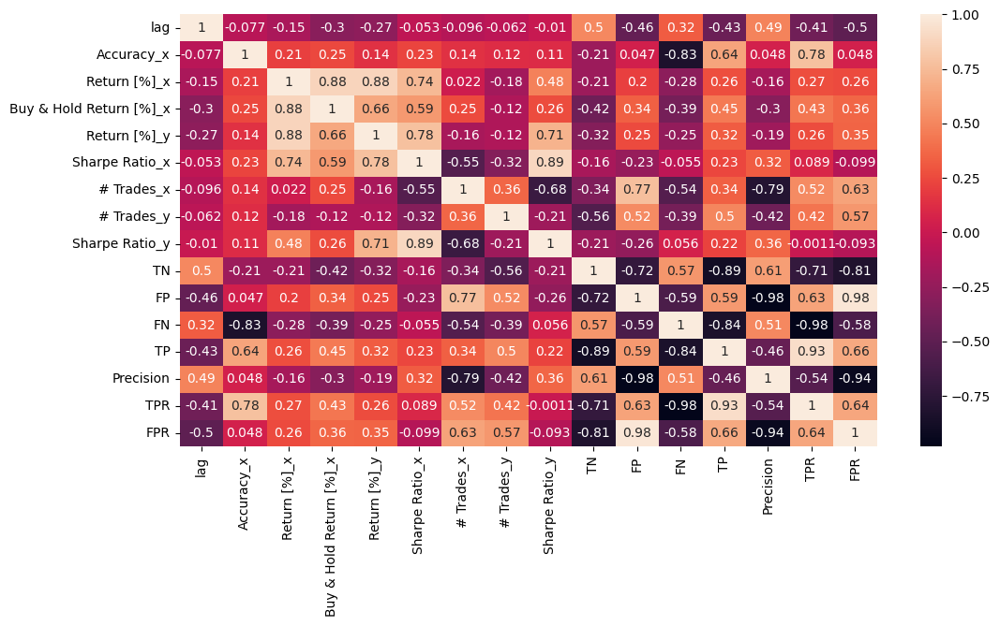

In [61]:
plt.figure(figsize=(12,6))
sns.heatmap(data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()].corr(numeric_only = True),annot = True)

<Axes: >

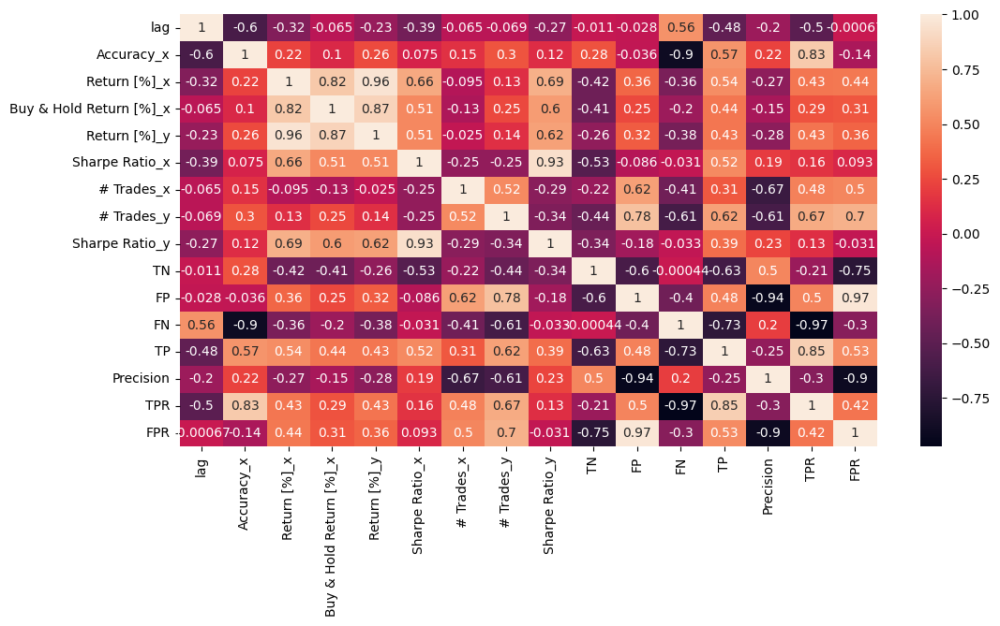

In [62]:
plt.figure(figsize=(12,6))
sns.heatmap(data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].corr(numeric_only = True),annot = True)

In [63]:
merged_df = pd.merge(data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()],data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()], on = 'Ticker')

In [64]:
merged_df[['Ticker','Model_x','Accuracy_x_x', 'Return [%]_x_x', 'Buy & Hold Return [%]_x_x','Model_y','Accuracy_x_y', 'Return [%]_y_y']]

,Ticker,Model_x,Accuracy_x_x,Return [%]_x_x,Buy & Hold Return [%]_x_x,Model_y,Accuracy_x_y,Return [%]_y_y
0,AAPL,Naive Bayes,0.883692,52.086655,30.377457,SGD Classifier,0.845765,53.790848
1,AMD,XGBoost,0.844501,95.717461,-33.765975,MLP,0.843236,89.041727
2,AMZN,XGBoost,0.895070,91.860315,22.496772,XGBoost,0.895070,85.176460
3,GOOGL,Decision Tree,0.787611,34.953998,16.213708,Decision Tree,0.787611,34.953998
4,META,SVM,0.821745,354.692579,94.434919,SVM,0.821745,354.055160
5,MSFT,Random Forest,0.677623,42.026809,17.260642,Gradient Boosting,0.690265,38.593637
6,NFLX,Decision Tree,0.810367,161.144968,61.218343,Naive Bayes,0.579014,135.570203
7,NVDA,Logistic Regression,0.876106,574.138232,298.891140,Logistic Regression,0.876106,574.138232
8,SPY,XGBoost,0.891277,39.388498,22.469699,K-Nearest Neighbors,0.824273,41.669320
9,TSLA,SGD Classifier,0.797724,170.442421,-29.499572,Gradient Boosting,0.863464,183.202794


In [65]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].to_csv('best_models.csv')

In [66]:
data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      XGBoostSGD ClassifierMLPLogistic RegressionSGD...
lag                                                                      285
Accuracy_x                                                          8.974716
Return [%]_x                                                      825.827358
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                       981.95937
Type                        gridgridgridnormalnormalnormalgridgridrandomgrid
Sharpe Ratio_x                                                      4.981568
# Trades_x                                                               224
# Trades_y                                                               363

In [67]:
accurate_models = data.loc[data.groupby('Ticker')['Accuracy_x'].idxmax()]

<Axes: xlabel='Ticker', ylabel='Return [%]_x'>

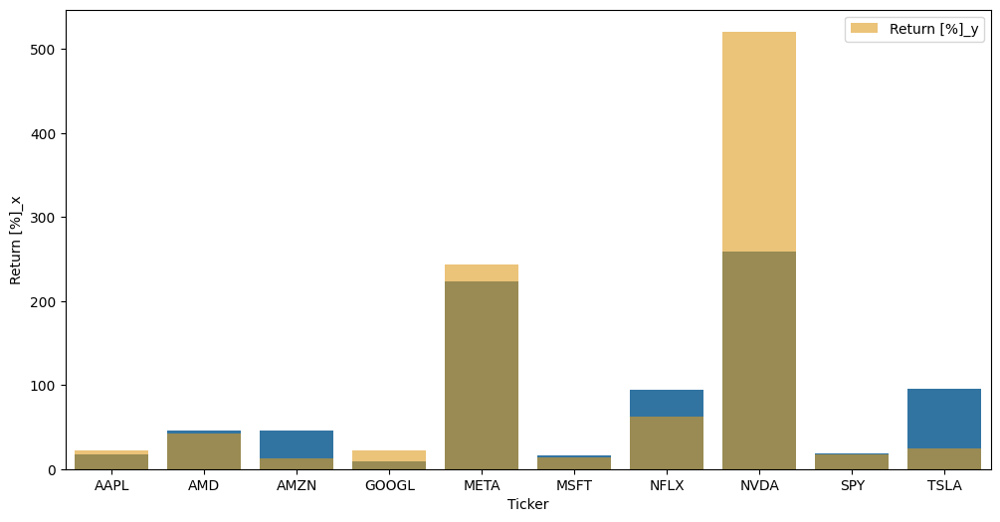

In [68]:
plt.figure(figsize=(12,6))
sns.barplot(data = accurate_models, x = 'Ticker', y = 'Return [%]_x')
# Second bar plot with adjusted position
sns.barplot(data=accurate_models, x='Ticker', y='Return [%]_y', color='orange', label='Return [%]_y', alpha=0.6)

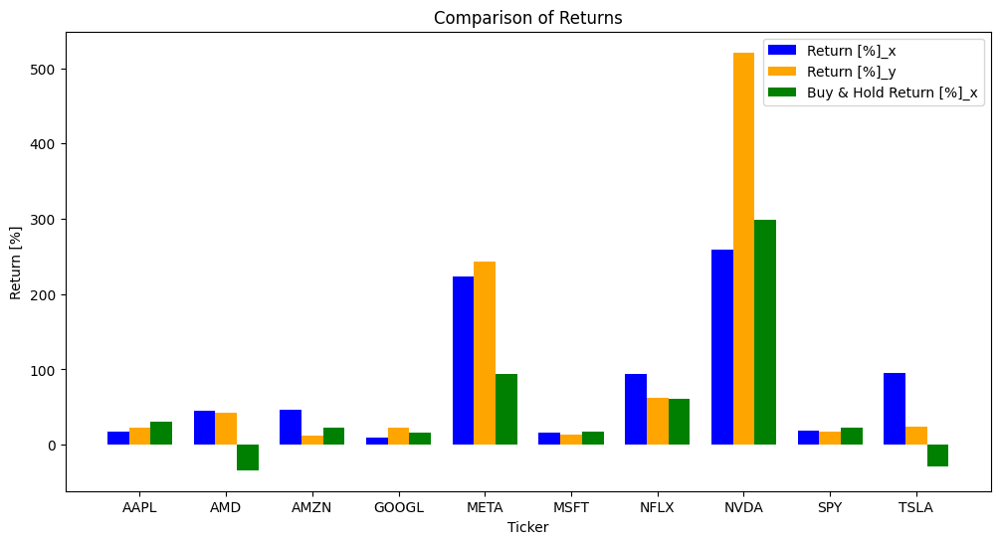

In [69]:
import numpy as np
plt.figure(figsize=(12, 6))

# Set position for bars
x = np.arange(len(accurate_models['Ticker']))
width = 0.25  # Adjusted width of the bars

# Create the first set of bars
plt.bar(x - width, accurate_models['Return [%]_x'], width, label='Return [%]_x', color='blue')

# Create the second set of bars
plt.bar(x, accurate_models['Return [%]_y'], width, label='Return [%]_y', color='orange')

# Create the third set of bars
plt.bar(x + width, accurate_models['Buy & Hold Return [%]_x'], width, label='Buy & Hold Return [%]_x', color='green')

# Customize the plot
plt.xlabel('Ticker')
plt.ylabel('Return [%]')
plt.title('Comparison of Returns')
plt.xticks(x, accurate_models['Ticker'])
plt.legend()

plt.show()

<Axes: >

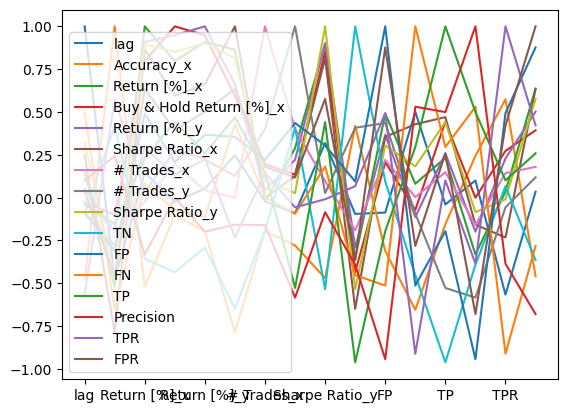

In [70]:
accurate_models.corr(numeric_only  = True).plot()

<Axes: >

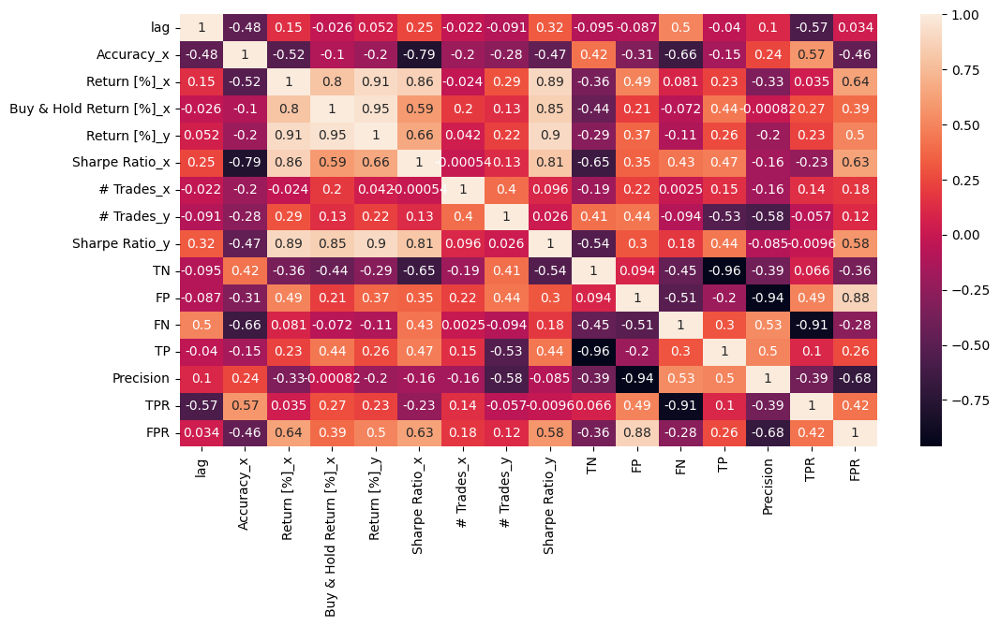

In [71]:
plt.figure(figsize = (12,6))
sns.heatmap(accurate_models.corr(numeric_only  = True),annot = True)

In [72]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      SGD ClassifierMLPXGBoostDecision TreeSVMGradie...
lag                                                                      220
Accuracy_x                                                          8.026549
Return [%]_x                                                     1218.232456
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1590.192378
Type                       normalgridnormalgridgridgridrandomgridnormalra...
Sharpe Ratio_x                                                      7.340787
# Trades_x                                                               242
# Trades_y                                                               297

In [73]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Model.value_counts()

Model
Gradient Boosting      2
SGD Classifier         1
MLP                    1
Decision Tree          1
XGBoost                1
SVM                    1
Naive Bayes            1
Logistic Regression    1
K-Nearest Neighbors    1
Name: count, dtype: int64

In [74]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].lag.value_counts()

lag
15    4
30    2
25    1
5     1
50    1
20    1
Name: count, dtype: int64

In [75]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Type.value_counts()

Type
grid      5
normal    3
random    2
Name: count, dtype: int64

In [76]:
log_df = data[data['Model'] == 'Logistic Regression']
log_df.loc[log_df.groupby('Ticker')['Return [%]_y'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      Logistic RegressionLogistic RegressionLogistic...
lag                                                                      245
Accuracy_x                                                          8.652339
Return [%]_x                                                      915.348933
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1350.146944
Type                       normalgridrandomnormalnormalnormalrandomgridgr...
Sharpe Ratio_x                                                      4.901846
# Trades_x                                                               235
# Trades_y                                                               308

In [77]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
2089,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
1973,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,MLP,30,0.843236,49.966701,-33.765975,89.041727,grid,0.403204,8,24,0.647533,428,19,105,239,0.926357,0.694767,0.042506
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1606,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,33.977935,16.213708,34.953998,grid,0.346024,42,66,0.387196,234,121,47,389,0.762745,0.892202,0.340845
4345,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
850,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Gradient Boosting,15,0.690265,33.658183,17.260642,38.593637,grid,0.658163,9,11,0.736065,371,4,241,175,0.977654,0.420673,0.010667
3852,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Naive Bayes,50,0.579014,104.704615,61.218343,135.570203,random,0.760370,25,20,0.900786,214,55,278,244,0.816054,0.467433,0.204461
1261,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
1020,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,K-Nearest Neighbors,15,0.824273,35.807309,22.469699,41.669320,normal,0.938145,27,29,1.093108,258,24,115,394,0.942584,0.774067,0.085106
1162,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,Gradient Boosting,15,0.863464,94.414747,-29.499572,183.202794,random,0.554122,48,23,0.752485,398,56,52,285,0.835777,0.845697,0.123348


In [78]:
log_df = data[data['Model'] == 'Logistic Regression']
log_df.loc[log_df.groupby('Ticker')['Return [%]_y'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
4810,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Logistic Regression,60,0.834387,13.046091,30.377457,22.560790,normal,0.224169,28,41,0.380928,290,81,50,370,0.820399,0.880952,0.218329
13,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Logistic Regression,0,0.849558,60.800917,-33.765975,83.446889,grid,0.473115,10,23,0.615952,430,17,102,242,0.934363,0.703488,0.038031
1846,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Logistic Regression,25,0.882427,27.221262,22.496772,31.950606,random,0.344589,32,20,0.373167,285,22,71,413,0.949425,0.853306,0.071661
949,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Logistic Regression,15,0.921618,11.708276,16.213708,33.184979,normal,0.152745,19,26,0.406186,338,17,45,391,0.958333,0.896789,0.047887
182,2022-01-03 00:00:00,2025-02-27 00:00:00,META,Logistic Regression,0,0.823009,270.685884,94.434919,318.204992,normal,1.080810,17,27,1.196960,202,77,63,449,0.853612,0.876953,0.275986
3705,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Logistic Regression,50,0.911504,0.882310,17.260642,15.694049,normal,0.015215,20,27,0.253966,333,42,28,388,0.902326,0.932692,0.112000
2288,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Logistic Regression,30,0.853350,84.891664,61.218343,112.759326,random,0.707818,30,16,0.775654,240,29,87,435,0.937500,0.833333,0.107807
1261,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
2054,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,Logistic Regression,30,0.858407,26.731302,22.469699,35.399857,grid,0.712957,30,31,0.943175,268,14,98,411,0.967059,0.807466,0.049645
1027,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,Logistic Regression,15,0.841972,42.274653,-29.499572,122.807224,normal,0.284156,27,55,0.683847,399,55,70,267,0.829193,0.792285,0.121145


In [79]:
log_df = data[data['Model'] == 'Logistic Regression']
log_df.loc[log_df.groupby('Ticker')['Return [%]_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      Logistic RegressionLogistic RegressionLogistic...
lag                                                                      365
Accuracy_x                                                          8.667509
Return [%]_x                                                     1314.356148
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                      868.147967
Type                       normalrandomgridgridnormalgridgridrandomrandom...
Sharpe Ratio_x                                                      6.528669
# Trades_x                                                               243
# Trades_y                                                               300

In [80]:
log_df = data[data['Model'] == 'SVM']
log_df.loc[log_df.groupby('Ticker')['Return [%]_y'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                                         SVMSVMSVMSVMSVMSVMSVMSVMSVMSVM
lag                                                                      215
Accuracy_x                                                          8.701643
Return [%]_x                                                      811.852054
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1263.230876
Type                       randomgridrandomnormalgridnormalrandomgridrand...
Sharpe Ratio_x                                                      4.444606
# Trades_x                                                               262
# Trades_y                                                               311

In [81]:
log_df = data[data['Model'] == 'SVM']
log_df.loc[log_df.groupby('Ticker')['Return [%]_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                                         SVMSVMSVMSVMSVMSVMSVMSVMSVMSVM
lag                                                                      215
Accuracy_x                                                          8.657396
Return [%]_x                                                     1263.540315
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                       764.36529
Type                       gridrandomnormalrandomgridnormalnormalrandomgr...
Sharpe Ratio_x                                                      6.045973
# Trades_x                                                               282
# Trades_y                                                               319

In [82]:
data.groupby('Model')[['Return [%]_x' , 'Buy & Hold Return [%]_x','Return [%]_y']].sum()

,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y
Model,,,
AdaBoost,28472.311100,19503.788182,30525.574622
Decision Tree,22188.949537,19503.788182,22549.694048
Gradient Boosting,27887.825010,19503.788182,29519.658792
K-Nearest Neighbors,21990.617687,19503.788182,21825.987409
LGBMClassifier,28735.968729,19503.788182,29080.731389
Logistic Regression,34191.024404,19503.788182,34101.317172
MLP,24401.771552,19503.788182,25507.795210
Naive Bayes,23362.673915,19503.788182,23532.017714
Random Forest,30429.205047,19503.788182,31296.153407


In [83]:
models_average_returns_over_lag = data.groupby(['lag','Model'])[['Return [%]_x' , 'Buy & Hold Return [%]_x','Return [%]_y']].mean()

In [84]:
models_average_returns_over_lag.shape

(156, 3)

In [85]:
models_average_returns_over_lag[models_average_returns_over_lag['Return [%]_x'] > models_average_returns_over_lag['Buy & Hold Return [%]_x']]

Return [%]_x  Buy & Hold Return [%]_x  Return [%]_y
lag Model                                                                   
0   AdaBoost                73.434325                50.009713     79.842710
    Decision Tree           50.965070                50.009713     53.110812
    Gradient Boosting       59.975423                50.009713     69.589375
    K-Nearest Neighbors     70.177297                50.009713     78.454491
    LGBMClassifier          87.114786                50.009713     88.474985
    Logistic Regression     87.540859                50.009713     91.163414
    MLP                     64.748032                50.009713     68.280563
    Naive Bayes             66.715703                50.009713     69.439313
    Random Forest           83.025439                50.009713     86.093583
    SGD Classifier          74.142989                50.009713     78.234227
    SVM                     76.971701                50.009713     80.705899
    XGBoost                 65.150333                50.009713     75.410772
5   AdaBoost                75.219150                50.009713     83.157550
    Decision Tree           55.287884                50.009713     52.491310
    Gradient Boosting       72.571044                50.009713     76.658825
    K-Nearest Neighbors     62.566298                50.009713     63.072233
    LGBMClassifier          88.784984                50.009713     90.245516
    Logistic Regression     84.249091                50.009713     86.817553
    MLP                     63.315699                50.009713     70.886121
    Naive Bayes             59.137331                50.009713     59.448174
    Random Forest           81.180301                50.009713     84.801626
    SGD Classifier          72.573138                50.009713     73.260162
    SVM                     79.263255                50.009713     86.151703
    XGBoost                 68.480949                50.009713     76.730381
10  AdaBoost                76.397390                50.009713     84.652217
    Decision Tree           57.211860                50.009713     58.327834
    Gradient Boosting       73.492867                50.009713     72.223473
    K-Nearest Neighbors     59.053038                50.009713     55.453721
    LGBMClassifier          86.866130                50.009713     85.450859
    Logistic Regression     84.112720                50.009713     87.913423
    MLP                     67.357459                50.009713     72.931125
    Naive Bayes             62.849470                50.009713     62.493539
    Random Forest           79.710428                50.009713     84.049106
    SGD Classifier          72.680239                50.009713     74.870311
    SVM                     73.979543                50.009713     77.648618
    XGBoost                 67.844679                50.009713     71.879594
15  AdaBoost                75.156413                50.009713     82.355005
    Decision Tree           56.309081                50.009713     60.247780
    Gradient Boosting       76.929263                50.009713     83.385992
    K-Nearest Neighbors     56.593657                50.009713     55.928268
    LGBMClassifier          79.946444                50.009713     78.666575
    Logistic Regression     85.863966                50.009713     90.444227
    MLP                     66.575331                50.009713     63.213047
    Naive Bayes             60.672972                50.009713     60.719147
    Random Forest           85.110711                50.009713     90.392655
    SGD Classifier          75.193932                50.009713     82.832442
    SVM                     79.644394                50.009713     74.866694
    XGBoost                 72.887695                50.009713     76.719237
20  AdaBoost                75.324166                50.009713     80.403979
    Decision Tree           61.218330                50.009713     57.798569
    Gradient Boosting

In [86]:
data.groupby(['Type'])[['Return [%]_x' , 'Buy & Hold Return [%]_x','Return [%]_y']].mean().sum()

Return [%]_x               206.385707
Buy & Hold Return [%]_x    150.029140
Return [%]_y               212.268462
dtype: float64

In [87]:
data.groupby(['lag'])[['Return [%]_x' , 'Buy & Hold Return [%]_x','Return [%]_y']].mean().sum()

Return [%]_x               894.338065
Buy & Hold Return [%]_x    650.126273
Return [%]_y               919.830002
dtype: float64

In [88]:
data.loc[data.groupby(['Type'])['Return [%]_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                                                          NVDANVDANVDA
Model                      Logistic RegressionSGD ClassifierLogistic Regr...
lag                                                                       80
Accuracy_x                                                          2.513274
Return [%]_x                                                     1376.198887
Buy & Hold Return [%]_x                                           896.673421
Return [%]_y                                                     1122.756086
Type                                                        gridnormalrandom
Sharpe Ratio_x                                                       2.91107
# Trades_x                                                                81
# Trades_y                                                               135

In [89]:
data.loc[data.groupby(['Model'])['Return [%]_y'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
489,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,AdaBoost,10,0.900126,218.499033,298.89114,465.798792,grid,0.712973,23,43,1.113851,293,49,30,419,0.895299,0.933185,0.143275
2828,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Decision Tree,40,0.807838,159.998402,298.89114,313.003889,grid,0.587568,37,70,0.985505,248,94,58,391,0.806186,0.870824,0.274854
3996,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Gradient Boosting,55,0.887484,200.119352,298.89114,484.805819,grid,0.684173,26,53,1.159217,285,57,32,417,0.879747,0.928731,0.166667
227,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,K-Nearest Neighbors,0,0.852086,178.252215,298.89114,444.444045,normal,0.640873,19,36,1.090348,293,49,68,381,0.886047,0.848552,0.143275
1272,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,LGBMClassifier,20,0.893805,252.525757,298.89114,456.690359,grid,0.760042,26,51,1.113724,284,58,26,423,0.879418,0.942094,0.169591
1261,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.89114,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
1271,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,MLP,20,0.859671,232.195825,298.89114,563.328519,grid,0.733842,25,50,1.199153,279,63,48,401,0.864224,0.893096,0.184211
3995,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Naive Bayes,55,0.863464,249.107256,298.89114,399.603475,grid,0.760592,28,49,1.042375,285,57,51,398,0.874725,0.886414,0.166667
872,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Random Forest,15,0.903919,259.226574,298.89114,520.931032,grid,0.788240,25,48,1.173786,295,47,29,420,0.899358,0.935412,0.137427
1010,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,SGD Classifier,15,0.874842,201.737856,298.89114,487.873678,normal,0.672631,20,42,1.136751,287,55,44,405,0.880435,0.902004,0.160819


In [90]:
data.loc[data.groupby(['lag'])['Return [%]_x'].idxmax()].sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                     NVDANVDANVDANVDANVDANVDANVDANVDANVDANVDANVDANV...
Model                      Logistic RegressionLogistic RegressionLogistic...
lag                                                                      390
Accuracy_x                                                         11.367889
Return [%]_x                                                       7290.4682
Buy & Hold Return [%]_x                                          3885.584824
Return [%]_y                                                     3538.521746
Type                       randomrandomrandomrandomrandomrandomrandomrand...
Sharpe Ratio_x                                                     15.047434
# Trades_x                                                               554
# Trades_y                                                               281

In [91]:
data.loc[data.groupby(['Type'])['Return [%]_y'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
1261,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
612,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Random Forest,10,0.901391,290.012128,298.891140,505.926564,normal,0.832639,23,42,1.157881,297,45,33,416,0.902386,0.926503,0.131579
4605,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.055160,94.434919,350.909789,random,1.249256,27,18,1.221680,202,77,64,448,0.853333,0.875000,0.275986


In [92]:
best = data.loc[data.groupby(['Ticker'])['Return [%]_y'].idxmax()]

In [93]:
data[data['Return [%]_x'] > data['Buy & Hold Return [%]_x']]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
4,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,37.917097,30.377457,52.086655,grid,0.570494,26,33,0.772970,314,57,35,385,0.871041,0.916667,0.153639
13,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Logistic Regression,0,0.849558,60.800917,-33.765975,83.446889,grid,0.473115,10,23,0.615952,430,17,102,242,0.934363,0.703488,0.038031
14,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Random Forest,0,0.845765,-2.430272,-33.765975,27.454552,grid,-0.026087,27,50,0.274112,415,32,90,254,0.888112,0.738372,0.071588
15,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,0,0.854614,2.345405,-33.765975,21.813634,grid,0.020854,22,56,0.190994,369,78,37,307,0.797403,0.892442,0.174497
16,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,SVM,0,0.841972,36.611202,-33.765975,43.016023,grid,0.325899,11,38,0.406033,432,15,110,234,0.939759,0.680233,0.033557
17,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Naive Bayes,0,0.840708,5.736412,-33.765975,20.794982,grid,0.053564,31,49,0.207156,401,46,80,264,0.851613,0.767442,0.102908
18,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Gradient Boosting,0,0.850822,21.571031,-33.765975,52.175500,grid,0.201231,26,36,0.458513,423,24,94,250,0.912409,0.726744,0.053691
19,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,K-Nearest Neighbors,0,0.771176,-5.577306,-33.765975,-16.307545,grid,-0.072198,25,51,-0.255959,414,33,148,196,0.855895,0.569767,0.073826
20,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Decision Tree,0,0.817952,-5.056397,-33.765975,3.237650,grid,-0.057430,39,54,0.039138,417,30,114,230,0.884615,0.668605,0.067114
21,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,AdaBoost,0,0.858407,-2.738204,-33.765975,39.006489,grid,-0.026518,22,49,0.340631,393,54,58,286,0.841176,0.831395,0.120805


In [94]:
data[data['Return [%]_y'] > data['Buy & Hold Return [%]_x']]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
4,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,37.917097,30.377457,52.086655,grid,0.570494,26,33,0.772970,314,57,35,385,0.871041,0.916667,0.153639
13,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Logistic Regression,0,0.849558,60.800917,-33.765975,83.446889,grid,0.473115,10,23,0.615952,430,17,102,242,0.934363,0.703488,0.038031
14,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Random Forest,0,0.845765,-2.430272,-33.765975,27.454552,grid,-0.026087,27,50,0.274112,415,32,90,254,0.888112,0.738372,0.071588
15,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,0,0.854614,2.345405,-33.765975,21.813634,grid,0.020854,22,56,0.190994,369,78,37,307,0.797403,0.892442,0.174497
16,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,SVM,0,0.841972,36.611202,-33.765975,43.016023,grid,0.325899,11,38,0.406033,432,15,110,234,0.939759,0.680233,0.033557
17,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Naive Bayes,0,0.840708,5.736412,-33.765975,20.794982,grid,0.053564,31,49,0.207156,401,46,80,264,0.851613,0.767442,0.102908
18,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Gradient Boosting,0,0.850822,21.571031,-33.765975,52.175500,grid,0.201231,26,36,0.458513,423,24,94,250,0.912409,0.726744,0.053691
19,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,K-Nearest Neighbors,0,0.771176,-5.577306,-33.765975,-16.307545,grid,-0.072198,25,51,-0.255959,414,33,148,196,0.855895,0.569767,0.073826
20,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Decision Tree,0,0.817952,-5.056397,-33.765975,3.237650,grid,-0.057430,39,54,0.039138,417,30,114,230,0.884615,0.668605,0.067114
21,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,AdaBoost,0,0.858407,-2.738204,-33.765975,39.006489,grid,-0.026518,22,49,0.340631,393,54,58,286,0.841176,0.831395,0.120805


<Axes: ylabel='Return [%]_x'>

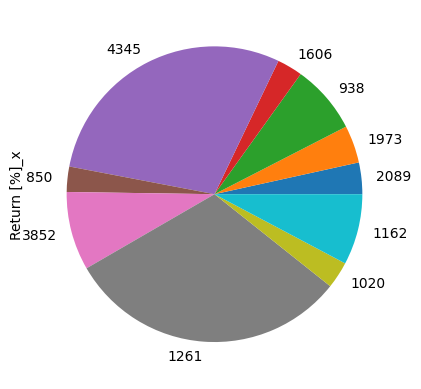

In [95]:
best['Return [%]_x'].plot(kind = 'pie',)

In [96]:
data.loc[data.groupby('Ticker')['Return [%]_x'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
264,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,Naive Bayes,0,0.883692,52.086655,30.377457,38.375888,random,0.772970,33,26,0.581169,314,57,35,385,0.871041,0.916667,0.153639
1835,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,XGBoost,25,0.844501,95.717461,-33.765975,87.694782,random,0.703695,25,18,0.643226,427,20,103,241,0.923372,0.700581,0.044743
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1866,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,34.953998,16.213708,34.560160,random,0.387196,66,39,0.354686,234,121,47,389,0.762745,0.892202,0.340845
4345,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
1366,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Random Forest,20,0.677623,42.026809,17.260642,38.215785,normal,0.808605,16,18,0.749024,364,11,244,172,0.939891,0.413462,0.029333
475,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Decision Tree,10,0.810367,161.144968,61.218343,114.764240,grid,0.862458,25,42,0.760932,201,68,82,440,0.866142,0.842912,0.252788
1521,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,574.138232,298.891140,270.006242,random,1.163954,42,22,0.811699,280,62,36,413,0.869474,0.919822,0.181287
3356,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,XGBoost,45,0.891277,39.388498,22.469699,36.206726,normal,0.966549,25,27,0.924635,260,22,64,445,0.952891,0.874263,0.078014
4026,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,SGD Classifier,55,0.797724,170.442421,-29.499572,111.252441,grid,0.915256,17,30,0.821154,448,6,154,183,0.968254,0.543027,0.013216


In [97]:
risk_df = data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()]

In [98]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Model.value_counts()

Model
Gradient Boosting      2
SGD Classifier         1
MLP                    1
Decision Tree          1
XGBoost                1
SVM                    1
Naive Bayes            1
Logistic Regression    1
K-Nearest Neighbors    1
Name: count, dtype: int64

In [99]:
data.Model.unique()

array(['Logistic Regression', 'Random Forest', 'XGBoost', 'SVM',
       'Naive Bayes', 'Gradient Boosting', 'K-Nearest Neighbors',
       'Decision Tree', 'AdaBoost', 'SGD Classifier', 'MLP',
       'LGBMClassifier'], dtype=object)

In [100]:
# Get unique models
unique_models = set(data.Model.unique())

# Get models corresponding to max Return [%]_y for each Ticker
max_return_models = set(data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Model)

# Find the common elements
common_models = unique_models.intersection(max_return_models)

print(common_models)

{'SVM', 'Naive Bayes', 'XGBoost', 'SGD Classifier', 'MLP', 'Logistic Regression', 'Decision Tree', 'K-Nearest Neighbors', 'Gradient Boosting'}


In [101]:
# Get unique models
unique_models = set(data.Model.unique())

# Get models corresponding to max Return [%]_y for each Ticker
max_return_models = set(data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()].Model)

# Find the uncommon elements
uncommon_models = unique_models.symmetric_difference(max_return_models)

print(uncommon_models)


{'LGBMClassifier', 'AdaBoost', 'Random Forest'}


In [102]:
data.loc[data.groupby('Ticker')['Precision'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
2089,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
4697,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,Naive Bayes,60,0.730721,30.040106,-33.765975,-9.493424,grid,0.410778,18,32,-0.189696,446,1,212,132,0.992481,0.383721,0.002237
1200,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,Naive Bayes,20,0.661188,23.061049,22.496772,-2.370502,grid,0.380742,43,47,-0.048113,307,0,268,216,1.000000,0.446281,0.000000
438,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,SGD Classifier,10,0.619469,-14.871086,16.213708,-16.374189,grid,-0.394528,21,25,-0.476736,353,2,299,137,0.985612,0.314220,0.005634
3181,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SGD Classifier,45,0.676359,136.459912,94.434919,141.089889,grid,0.940720,18,25,0.972738,272,7,249,263,0.974074,0.513672,0.025090
2414,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,SGD Classifier,35,0.797724,-1.471116,17.260642,-3.947700,grid,-0.035154,21,27,-0.097766,375,0,160,256,1.000000,0.615385,0.000000
2948,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,MLP,40,0.841972,35.347824,61.218343,17.550040,normal,0.371688,24,45,0.221158,259,10,115,407,0.976019,0.779693,0.037175
3342,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Random Forest,45,0.844501,213.596135,298.891140,259.295540,normal,0.819866,34,45,1.009052,334,8,115,334,0.976608,0.743875,0.023392
1283,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,SGD Classifier,20,0.505689,-1.780678,22.469699,-0.619626,grid,-0.094619,23,24,-0.033052,282,0,391,118,1.000000,0.231827,0.000000
4936,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,SGD Classifier,60,0.815424,91.541910,-29.499572,75.606000,normal,0.654064,16,31,0.640416,452,2,144,193,0.989744,0.572700,0.004405


In [103]:
data.loc[data.groupby('Ticker')['FPR'].idxmin()].columns

Index(['Start_x', 'End_x', 'Ticker', 'Model', 'lag', 'Accuracy_x',
       'Return [%]_x', 'Buy & Hold Return [%]_x', 'Return [%]_y', 'Type',
       'Sharpe Ratio_x', '# Trades_x', '# Trades_y', 'Sharpe Ratio_y', 'TN',
       'FP', 'FN', 'TP', 'Precision', 'TPR', 'FPR'],
      dtype='object')

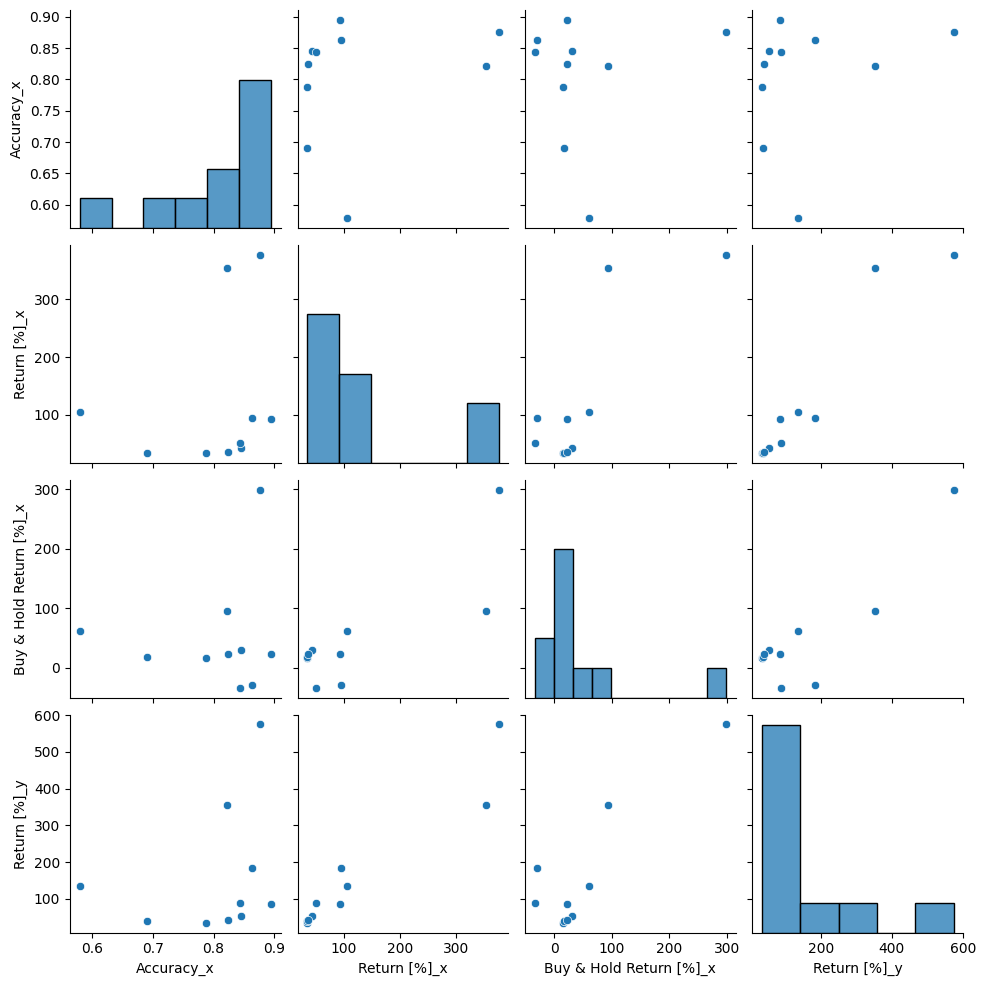

In [104]:
import seaborn as sns
sns.pairplot(risk_df[['Accuracy_x', 'Return [%]_x','Buy & Hold Return [%]_x', 'Return [%]_y']])

<Axes: >

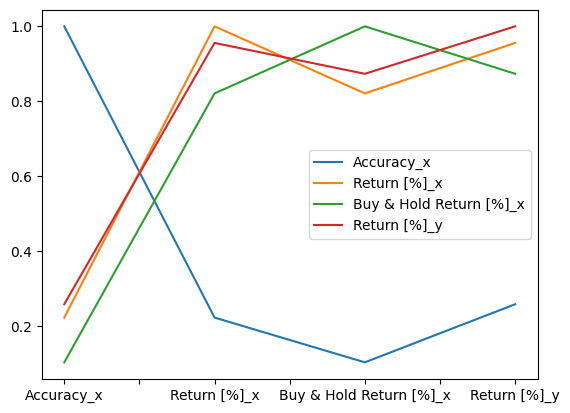

In [105]:
risk_df[['Accuracy_x', 'Return [%]_x','Buy & Hold Return [%]_x', 'Return [%]_y']].corr().plot()

In [106]:
risk_df[['Accuracy_x', 'Return [%]_x','Buy & Hold Return [%]_x', 'Return [%]_y']]

,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y
2089,0.845765,42.043495,30.377457,53.790848
1973,0.843236,49.966701,-33.765975,89.041727
938,0.895070,91.860315,22.496772,85.176460
1606,0.787611,33.977935,16.213708,34.953998
4345,0.821745,354.692579,94.434919,354.055160
850,0.690265,33.658183,17.260642,38.593637
3852,0.579014,104.704615,61.218343,135.570203
1261,0.876106,377.106576,298.891140,574.138232
1020,0.824273,35.807309,22.469699,41.669320
1162,0.863464,94.414747,-29.499572,183.202794


<Axes: >

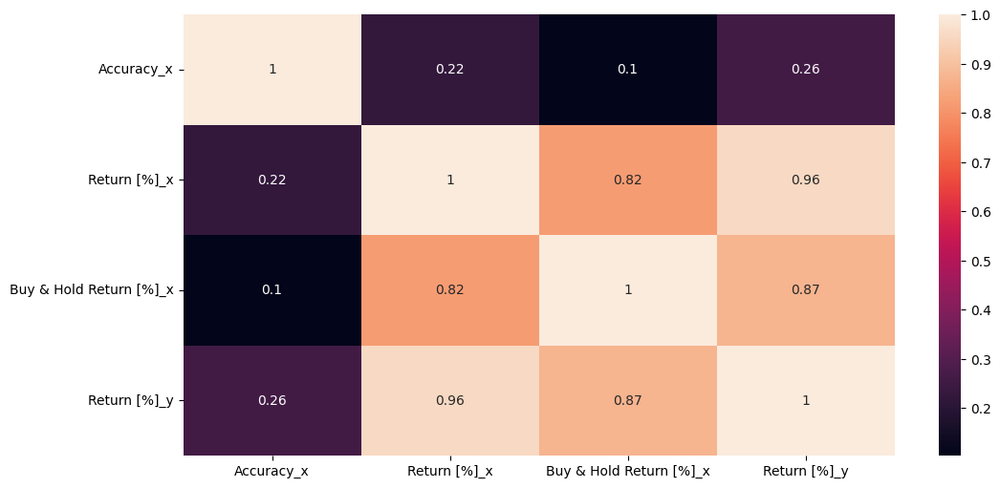

In [107]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
sns.heatmap(risk_df[['Accuracy_x', 'Return [%]_x','Buy & Hold Return [%]_x', 'Return [%]_y']].corr(),annot = True)

<Axes: xlabel='Accuracy_x', ylabel='Return [%]_y'>

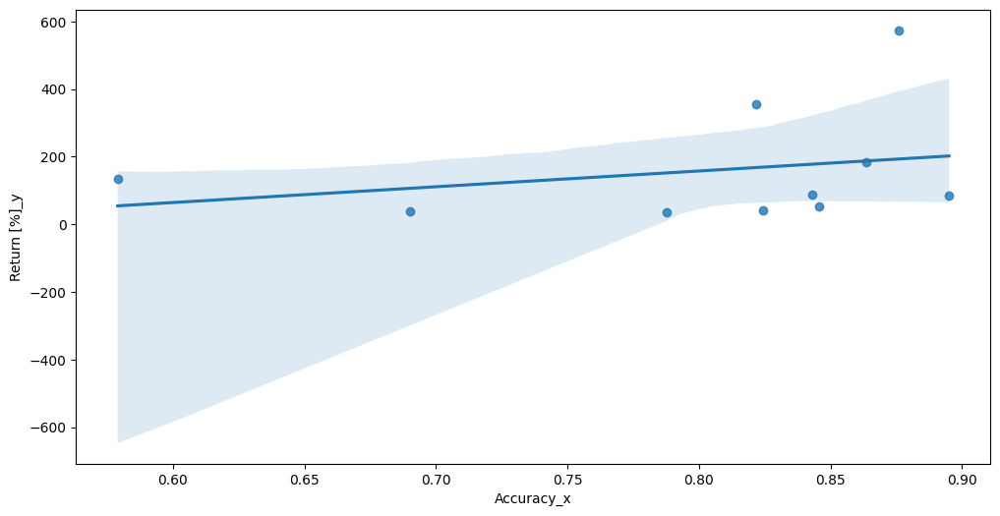

In [108]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
sns.regplot(data=risk_df, x ='Accuracy_x', y = 'Return [%]_y')

<Axes: xlabel='Accuracy_x', ylabel='Return [%]_x'>

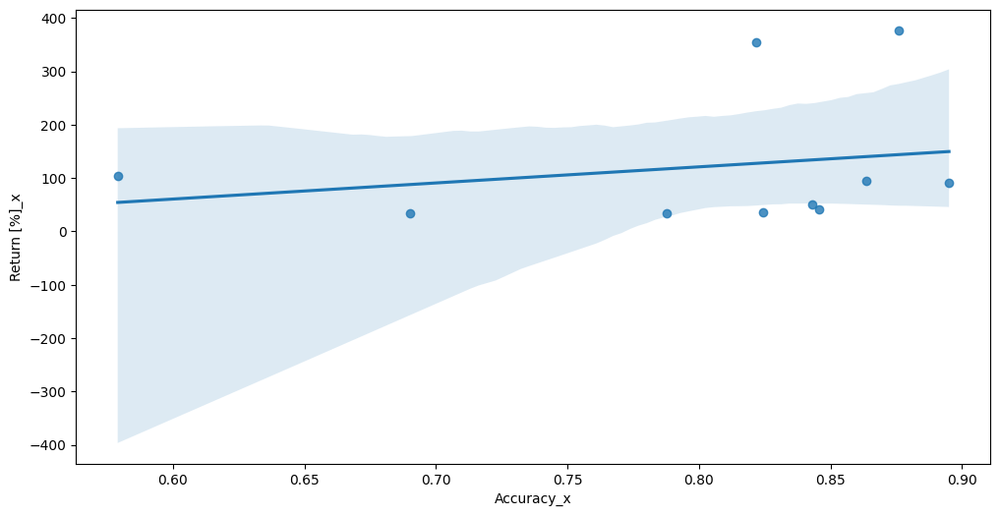

In [109]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
sns.regplot(data=risk_df, x ='Accuracy_x', y = 'Return [%]_x')

In [110]:
risk_df.groupby('Type').apply(lambda x: x.sort_values('lag')).reset_index(drop=True)

C:\Users\sachi\AppData\Local\Temp\ipykernel_2636\3017192745.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  risk_df.groupby('Type').apply(lambda x: x.sort_values('lag')).reset_index(drop=True)


,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
0,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
1,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Gradient Boosting,15,0.690265,33.658183,17.260642,38.593637,grid,0.658163,9,11,0.736065,371,4,241,175,0.977654,0.420673,0.010667
2,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
3,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,33.977935,16.213708,34.953998,grid,0.346024,42,66,0.387196,234,121,47,389,0.762745,0.892202,0.340845
4,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,MLP,30,0.843236,49.966701,-33.765975,89.041727,grid,0.403204,8,24,0.647533,428,19,105,239,0.926357,0.694767,0.042506
5,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
6,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,K-Nearest Neighbors,15,0.824273,35.807309,22.469699,41.669320,normal,0.938145,27,29,1.093108,258,24,115,394,0.942584,0.774067,0.085106
7,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
8,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,Gradient Boosting,15,0.863464,94.414747,-29.499572,183.202794,random,0.554122,48,23,0.752485,398,56,52,285,0.835777,0.845697,0.123348
9,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Naive Bayes,50,0.579014,104.704615,61.218343,135.570203,random,0.760370,25,20,0.900786,214,55,278,244,0.816054,0.467433,0.204461


In [111]:
risk_df.to_csv('best_models.csv')

In [112]:
risk_df.groupby('Type').get_group('normal')

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
2089,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1020,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,K-Nearest Neighbors,15,0.824273,35.807309,22.469699,41.669320,normal,0.938145,27,29,1.093108,258,24,115,394,0.942584,0.774067,0.085106


'SGD Classifier': SGDClassifier(alpha=0.001, loss='log_loss', random_state=42) [ AAPL,30]
'XGBoost': XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=1,
              num_parallel_tree=None, ...)[AMZN, 15]
'K-Nearest Neighbors': KNeighborsClassifier(),[SPY, 15 ]
'MLP': MLPClassifier(activation='tanh', max_iter=1000, random_state=42, solver='sgd'),[AMD, 30]
'Decision Tree': DecisionTreeClassifier(max_depth=10, min_samples_split=10, random_state=42),[GOOGL, 25]
'SVM': SVC(C=10, kernel='linear', probability=True, random_state=42),[META 5]
'Gradient Boosting': GradientBoostingClassifier(learning_rate=0.05, min_samples_split=10,
                           random_state=42),[MSFT 15]
'Logistic Regression': LogisticRegression(C=0.1, max_iter=1000, penalty='l1', random_state=42,
                   solver='liblinear'),[NVDA 20]
'Naive Bayes': BernoulliNB(alpha=0.1),[NFLX ,50]
'Gradient Boosting': GradientBoostingClassifier(learning_rate=0.05, max_depth=5, n_estimators=200,
        random_state=42),[TSLA , 15]





<Axes: xlabel='Return [%]_y', ylabel='Sharpe Ratio_y'>

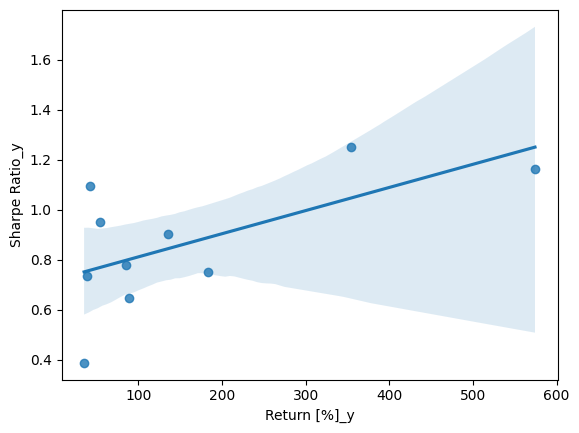

In [113]:
sns.regplot(data=risk_df, x = 'Return [%]_y', y = 'Sharpe Ratio_y')

In [114]:
risk_df.sum()

Start_x                    2022-01-03 00:00:002022-01-03 00:00:002022-01-...
End_x                      2025-02-27 00:00:002025-02-27 00:00:002025-02-...
Ticker                               AAPLAMDAMZNGOOGLMETAMSFTNFLXNVDASPYTSLA
Model                      SGD ClassifierMLPXGBoostDecision TreeSVMGradie...
lag                                                                      220
Accuracy_x                                                          8.026549
Return [%]_x                                                     1218.232456
Buy & Hold Return [%]_x                                           500.097133
Return [%]_y                                                     1590.192378
Type                       normalgridnormalgridgridgridrandomgridnormalra...
Sharpe Ratio_x                                                      7.340787
# Trades_x                                                               242
# Trades_y                                                               297

In [115]:
data.groupby(['Ticker','lag'])

In [116]:
data.Ticker.value_counts()

Ticker
AAPL     468
AMD      468
AMZN     468
GOOGL    468
META     468
MSFT     468
NFLX     468
NVDA     468
SPY      468
TSLA     468
Name: count, dtype: int64

In [117]:
data.groupby(['lag','Type','Model'])[['Return [%]_x','Return [%]_y','Buy & Hold Return [%]_x']].sum()

Return [%]_x  Return [%]_y  \
lag Type   Model                                             
0   grid   AdaBoost               638.474977    978.093985   
           Decision Tree          507.300846    592.932955   
           Gradient Boosting      533.242500    673.677530   
           K-Nearest Neighbors    602.647603    899.835226   
           LGBMClassifier         833.499740    946.444104   
           Logistic Regression    823.555039   1031.365756   
           MLP                    575.717654    709.246606   
           Naive Bayes            595.299965    802.501777   
           Random Forest          850.447001    824.444233   
           SGD Classifier         691.539154    803.490765   
           SVM                    693.439435    843.293088   
           XGBoost                701.272245    794.592084   
    normal AdaBoost               586.460786    770.502692   
           Decision Tree          592.016947    501.420620   
           Gradient Boosting      603.082619    826.657532   
           K-Nearest Neighbors    606.630786    860.252008   
           LGBMClassifier         833.499740    946.444104   
           Logistic Regression    774.501330   1009.551140   
           MLP                    581.292951    635.165854   
           Naive Bayes            603.669358    761.774042   
           Random Forest          763.300323    917.368279   
           SGD Classifier         641.801357    912.061821   
           SVM                    715.660134    900.432431   
           XGBoost                519.717640    810.921559   
    random AdaBoost               978.093985    646.684614   
           Decision Tree          429.634307    498.970773   
           Gradient Boosting      662.937564    587.346202   
           K-Nearest Neighbors    896.040529    593.547499   
           LGBMClassifier         946.444104    761.361347   
           Logistic Regression   1028.169412    693.985538   
           MLP                    785.430344    704.004429   
           Naive Bayes            802.501777    518.903561   
           Random Forest          877.015859    840.994986   
           SGD Classifier         890.949168    631.474225   
           SVM                    900.051453    677.451450   
           XGBoost                733.520114    656.809506   
5   grid   AdaBoost               655.996521    998.382042   
           Decision Tree          519.250569    517.360111   
           Gradient Boosting      577.500895    742.804099   
           K-Nearest Neighbors    598.910862    630.005065   
           LGBMClassifier         853.793404    955.962720   
           Logistic Regression    836.526655   1041.535303   
           MLP                    598.401290    761.017341   
           Naive Bayes            556.631968    661.214504   
           Random Forest          786.025172    941.470591   
           SGD Classifier         687.619741    843.168065   
           SVM                    777.432614    951.308987   
           XGBoost                674.997234    797.960138   
    normal AdaBoost               602.195923    826.434678   
           Decision Tree          602.651699    540.077681   
           Gradient Boosting      666.768117    804.874825   
           K-Nearest Neighbors    650.686991    700.810577   
           LGBMClassifier         853.793404    955.962720   
           Logistic Regression    597.475252    821.885282   
           MLP                    496.698453    579.159212   
           Naive Bayes            556.273470    660.032502   
           Random Forest          711.521096    838.447690   
           SGD Classifier         697.092871    789.721544   
           SVM                    649.156038    881.143805   
           XGBoost                595.220076    808.863364   
    random AdaBoost               998.382042    669.909768   
           Decision Tree          536.734264    517.301520   
           Gradient Boosting      932.862301    752.085839   
  

# Average returns of the model still outperforming in the portfolio

In [118]:
average_returns = data.groupby(['lag','Model','Ticker','Type'])[['Return [%]_x','Return [%]_y','Buy & Hold Return [%]_x']].mean().groupby(['lag','Type','Model'])[['Return [%]_x','Return [%]_y','Buy & Hold Return [%]_x']].sum()

In [119]:
average_returns.shape

(468, 3)

In [120]:
average_returns[average_returns['Return [%]_y'] > average_returns['Return [%]_x']].shape[0]/average_returns.shape[0] * 100

58.97435897435898

In [121]:
average_returns[average_returns['Return [%]_y'] > average_returns['Buy & Hold Return [%]_x']].shape[0]/average_returns.shape[0] * 100

92.3076923076923

In [122]:
average_returns[average_returns['Return [%]_x'] > average_returns['Buy & Hold Return [%]_x']].shape[0]/average_returns.shape[0] * 100

94.65811965811966

In [123]:
average_returns

Return [%]_x  Return [%]_y  \
lag Type   Model                                             
0   grid   AdaBoost               638.474977    978.093985   
           Decision Tree          507.300846    592.932955   
           Gradient Boosting      533.242500    673.677530   
           K-Nearest Neighbors    602.647603    899.835226   
           LGBMClassifier         833.499740    946.444104   
           Logistic Regression    823.555039   1031.365756   
           MLP                    575.717654    709.246606   
           Naive Bayes            595.299965    802.501777   
           Random Forest          850.447001    824.444233   
           SGD Classifier         691.539154    803.490765   
           SVM                    693.439435    843.293088   
           XGBoost                701.272245    794.592084   
    normal AdaBoost               586.460786    770.502692   
           Decision Tree          592.016947    501.420620   
           Gradient Boosting      603.082619    826.657532   
           K-Nearest Neighbors    606.630786    860.252008   
           LGBMClassifier         833.499740    946.444104   
           Logistic Regression    774.501330   1009.551140   
           MLP                    581.292951    635.165854   
           Naive Bayes            603.669358    761.774042   
           Random Forest          763.300323    917.368279   
           SGD Classifier         641.801357    912.061821   
           SVM                    715.660134    900.432431   
           XGBoost                519.717640    810.921559   
    random AdaBoost               978.093985    646.684614   
           Decision Tree          429.634307    498.970773   
           Gradient Boosting      662.937564    587.346202   
           K-Nearest Neighbors    896.040529    593.547499   
           LGBMClassifier         946.444104    761.361347   
           Logistic Regression   1028.169412    693.985538   
           MLP                    785.430344    704.004429   
           Naive Bayes            802.501777    518.903561   
           Random Forest          877.015859    840.994986   
           SGD Classifier         890.949168    631.474225   
           SVM                    900.051453    677.451450   
           XGBoost                733.520114    656.809506   
5   grid   AdaBoost               655.996521    998.382042   
           Decision Tree          519.250569    517.360111   
           Gradient Boosting      577.500895    742.804099   
           K-Nearest Neighbors    598.910862    630.005065   
           LGBMClassifier         853.793404    955.962720   
           Logistic Regression    836.526655   1041.535303   
           MLP                    598.401290    761.017341   
           Naive Bayes            556.631968    661.214504   
           Random Forest          786.025172    941.470591   
           SGD Classifier         687.619741    843.168065   
           SVM                    777.432614    951.308987   
           XGBoost                674.997234    797.960138   
    normal AdaBoost               602.195923    826.434678   
           Decision Tree          602.651699    540.077681   
           Gradient Boosting      666.768117    804.874825   
           K-Nearest Neighbors    650.686991    700.810577   
           LGBMClassifier         853.793404    955.962720   
           Logistic Regression    597.475252    821.885282   
           MLP                    496.698453    579.159212   
           Naive Bayes            556.273470    660.032502   
           Random Forest          711.521096    838.447690   
           SGD Classifier         697.092871    789.721544   
           SVM                    649.156038    881.143805   
           XGBoost                595.220076    808.863364   
    random AdaBoost               998.382042    669.909768   
           Decision Tree          536.734264    517.301520   
           Gradient Boosting      932.862301    752.085839   
  

In [124]:
data.loc[data.groupby('Ticker')['Return [%]_y'].idxmax()]

,Start_x,End_x,Ticker,Model,lag,Accuracy_x,Return [%]_x,Buy & Hold Return [%]_x,Return [%]_y,Type,Sharpe Ratio_x,# Trades_x,# Trades_y,Sharpe Ratio_y,TN,FP,FN,TP,Precision,TPR,FPR
2089,2022-01-03 00:00:00,2025-02-27 00:00:00,AAPL,SGD Classifier,30,0.845765,42.043495,30.377457,53.790848,normal,0.759493,17,20,0.950607,366,5,117,303,0.983766,0.721429,0.013477
1973,2022-01-03 00:00:00,2025-02-27 00:00:00,AMD,MLP,30,0.843236,49.966701,-33.765975,89.041727,grid,0.403204,8,24,0.647533,428,19,105,239,0.926357,0.694767,0.042506
938,2022-01-03 00:00:00,2025-02-27 00:00:00,AMZN,XGBoost,15,0.895070,91.860315,22.496772,85.176460,normal,0.794970,26,35,0.778165,280,27,56,428,0.940659,0.884298,0.087948
1606,2022-01-03 00:00:00,2025-02-27 00:00:00,GOOGL,Decision Tree,25,0.787611,33.977935,16.213708,34.953998,grid,0.346024,42,66,0.387196,234,121,47,389,0.762745,0.892202,0.340845
4345,2022-01-03 00:00:00,2025-02-27 00:00:00,META,SVM,5,0.821745,354.692579,94.434919,354.055160,grid,1.220025,18,27,1.249256,202,77,64,448,0.853333,0.875000,0.275986
850,2022-01-03 00:00:00,2025-02-27 00:00:00,MSFT,Gradient Boosting,15,0.690265,33.658183,17.260642,38.593637,grid,0.658163,9,11,0.736065,371,4,241,175,0.977654,0.420673,0.010667
3852,2022-01-03 00:00:00,2025-02-27 00:00:00,NFLX,Naive Bayes,50,0.579014,104.704615,61.218343,135.570203,random,0.760370,25,20,0.900786,214,55,278,244,0.816054,0.467433,0.204461
1261,2022-01-03 00:00:00,2025-02-27 00:00:00,NVDA,Logistic Regression,20,0.876106,377.106576,298.891140,574.138232,grid,0.906271,22,42,1.163954,280,62,36,413,0.869474,0.919822,0.181287
1020,2022-01-03 00:00:00,2025-02-27 00:00:00,SPY,K-Nearest Neighbors,15,0.824273,35.807309,22.469699,41.669320,normal,0.938145,27,29,1.093108,258,24,115,394,0.942584,0.774067,0.085106
1162,2022-01-03 00:00:00,2025-02-27 00:00:00,TSLA,Gradient Boosting,15,0.863464,94.414747,-29.499572,183.202794,random,0.554122,48,23,0.752485,398,56,52,285,0.835777,0.845697,0.123348
